**PREPROCESSING**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install pandas
!pip install numpy
!pip install seaborn
!pip install matplotlib
!pip install geojsonio


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.8/151.8 kB 4.6 MB/s eta 0:00:00
  Created wheel for geojsonio: filename=geojsonio-0.0.3-py3-none-any.whl size=5021 sha256=636436168d000237df820437ab258174f29a5bb7938742582fae4d31d46dcbc6
  Stored in directory: /root/.cache/pip/wheels/78/60/62/cdb9a4acb45a5430c3465aeb4b700bd478a45a1ac6d7a7356c
Successfully built geojsonio


In [4]:
import pandas as pd
import numpy as np
import glob

#initialize empty DataFrames
dailyGridActivity = pd.DataFrame()
hourlyGridActivity = pd.DataFrame()

#get all .txt files
filenames = glob.glob("/content/drive/MyDrive/txt_files/*.txt")

#data columns
col_list = ['gridID', 'timeInterval', 'countryCode', 'smsIn', 'smsOut', 'callIn', 'callOut', 'internet']

#read each file
for file in filenames:
    read_data = pd.read_csv(file, sep='\t', header=None, names=col_list, parse_dates=True)

    #convert timeInterval to lacal time CET (Milan)
    read_data['startTime'] = pd.to_datetime(read_data.timeInterval, unit='ms', utc=True).dt.tz_convert('CET').dt.tz_localize(None)

    #remove useless columns
    read_data.drop(columns=['timeInterval', 'countryCode'], inplace=True)

    #daily groupby
    read_data_daily = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='D')]).sum()
    dailyGridActivity = pd.concat([dailyGridActivity, read_data_daily])
    dailyGridActivity = dailyGridActivity.groupby(['gridID', 'startTime']).sum()

    #hourly groupby
    read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='H')]).sum()
    hourlyGridActivity = pd.concat([hourlyGridActivity, read_data_hourly])
    hourlyGridActivity = hourlyGridActivity.groupby(['gridID', 'startTime']).sum()

<ipython-input-4-0181d0c1d72c>:31: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='H')]).sum()
<ipython-input-4-0181d0c1d72c>:31: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='H')]).sum()
<ipython-input-4-0181d0c1d72c>:31: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='H')]).sum()
<ipython-input-4-0181d0c1d72c>:31: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  read_data_hourly = read_data.groupby(['gridID', pd.Grouper(key='startTime', freq='H')]).sum()
<ipython-input-4-0181d0c1d72c>:31: FutureWarning: 'H' is deprecated and will be remo

In [5]:
hourlyGridActivity

smsIn     smsOut     callIn    callOut  \
gridID startTime                                                         
1      2013-12-14 00:00:00   2.292686   1.851680   0.320627   0.460704   
       2013-12-14 01:00:00   0.774059   0.739695   0.108039   0.290462   
       2013-12-14 02:00:00   1.064889   0.989513   0.134176   0.056388   
       2013-12-14 03:00:00   0.438680   0.108663   0.082526   0.321252   
       2013-12-14 04:00:00   0.194139   0.053438   0.027300   0.109826   
...                               ...        ...        ...        ...   
10000  2013-12-18 19:00:00  14.465525   6.927479  12.070300  13.819781   
       2013-12-18 20:00:00  12.651467   6.398425  13.500093   9.935763   
       2013-12-18 21:00:00  12.276795  12.517817   6.293943   6.989723   
       2013-12-18 22:00:00   6.395307   2.736607   2.151215   2.293231   
       2013-12-18 23:00:00   3.554960   3.532233   1.400145   1.261940   

                              internet  
gridID startTime                        
1      2013-12-14 00:00:00   54.578768  
       2013-12-14 01:00:00   43.068078  
       2013-12-14 02:00:00   42.215755  
       2013-12-14 03:00:00   38.091353  
       2013-12-14 04:00:00   35.006436  
...                                ...  
10000  2013-12-18 19:00:00  159.032423  
       2013-12-18 20:00:00  197.607660  
       2013-12-18 21:00:00  192.684946  
       2013-12-18 22:00:00  129.173664  
       2013-12-18 23:00:00   97.232657  

[1199674 rows x 5 columns]

In [6]:
dailyGridActivity

smsIn      smsOut      callIn     callOut     internet
gridID startTime                                                              
1      2013-12-14   96.034903   51.090641   60.925299   62.996919  1547.682511
       2013-12-15   87.020691   73.133520   46.080555   49.436779  1586.064564
       2013-12-16  103.681760   49.933050   72.923762   75.848480  1364.116830
       2013-12-17   89.800878   44.176657   71.049228   73.283391  1396.638187
       2013-12-18  102.262328   47.992261   76.170815   74.932620  1419.880735
...                       ...         ...         ...         ...          ...
10000  2013-12-14  200.525931  101.918327  150.132776  156.560353  2825.472116
       2013-12-15  159.418179   77.764810   99.389918  111.111362  2774.193744
       2013-12-16  275.650618  104.246278  217.027671  251.145180  2805.607331
       2013-12-17  252.957426   90.115594  216.399433  234.348303  2845.903735
       2013-12-18  239.401630   97.530366  209.574339  227.236080  2825.673229

[49990 rows x 5 columns]

In [7]:
totalGridActivity = dailyGridActivity.groupby('gridID').sum()

In [8]:
totalGridActivity

,smsIn,smsOut,callIn,callOut,internet
gridID,,,,,
1,478.800559,266.326129,327.149660,336.498189,7314.382827
2,485.510072,270.231072,332.073895,341.906339,7346.780065
3,492.652083,274.387730,337.315549,347.663102,7381.265644
4,459.366334,255.015392,312.886523,320.833383,7220.543641
5,428.293517,237.824058,291.647503,300.196676,6554.524564
...,...,...,...,...,...
9996,1726.470452,764.099966,1181.413406,1384.047285,25327.248228
9997,1887.447296,843.935697,1258.532106,1495.723848,28811.768025
9998,1855.476879,828.543734,1242.052815,1472.236360,28148.920211


In [9]:
dailyGridActivity['sms'] = dailyGridActivity['smsIn'] + dailyGridActivity['smsOut']
dailyGridActivity['call'] = dailyGridActivity['callIn'] + dailyGridActivity['callOut']

hourlyGridActivity['sms'] = hourlyGridActivity['smsIn'] + hourlyGridActivity['smsOut']
hourlyGridActivity['call'] = hourlyGridActivity['callIn'] + hourlyGridActivity['callOut']

totalGridActivity['sms'] = totalGridActivity['smsIn']+totalGridActivity['smsOut']
totalGridActivity['call'] = totalGridActivity['callIn']+totalGridActivity['callOut']

In [10]:
dfs = [hourlyGridActivity, dailyGridActivity, totalGridActivity]
df_names = ['hourlyGridActivity', 'dailyGridActivity', 'totalGridActivity']

**Καθαρισμός Ελλιπών Τιμών Με Linear Interpolation**


DataFrame: hourlyGridActivity


<ipython-input-11-bf464847b338>:23: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[columns_to_clean] = df[columns_to_clean].fillna(method='bfill').fillna(method='ffill')


 Statistics after cleaning data:
              smsIn        smsOut        callIn       callOut      internet  \
count  1.199674e+06  1.199674e+06  1.199674e+06  1.199674e+06  1.199674e+06   
mean   2.648275e+01  1.383731e+01  1.880172e+01  2.180040e+01  3.555878e+02   
std    6.461727e+01  3.343718e+01  4.735225e+01  5.494388e+01  6.864354e+02   
min    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
25%    1.801180e+00  1.169199e+00  7.519982e-01  9.651237e-01  6.520593e+01   
50%    7.895058e+00  4.275592e+00  4.619692e+00  5.493261e+00  1.551229e+02   
75%    2.532524e+01  1.270770e+01  1.790385e+01  2.044054e+01  3.561041e+02   
max    3.786154e+03  2.916129e+03  2.041425e+03  2.593100e+03  3.360687e+04   

                sms          call  
count  1.199674e+06  1.199674e+06  
mean   4.032005e+01  4.060212e+01  
std    9.564442e+01  1.016108e+02  
min    0.000000e+00  0.000000e+00  
25%    3.208719e+00  1.803167e+00  
50%    1.262212e+01  1.022657e+01  
75%

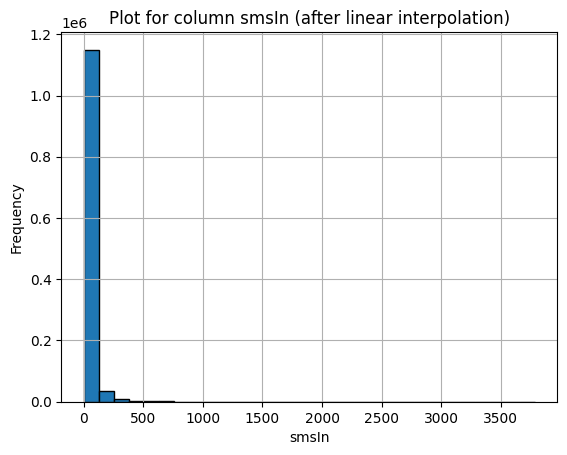

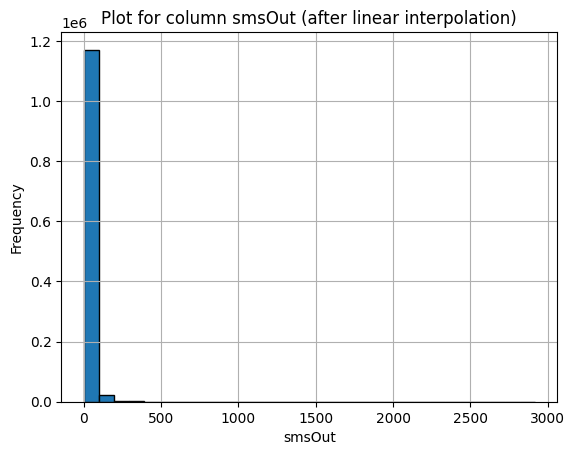

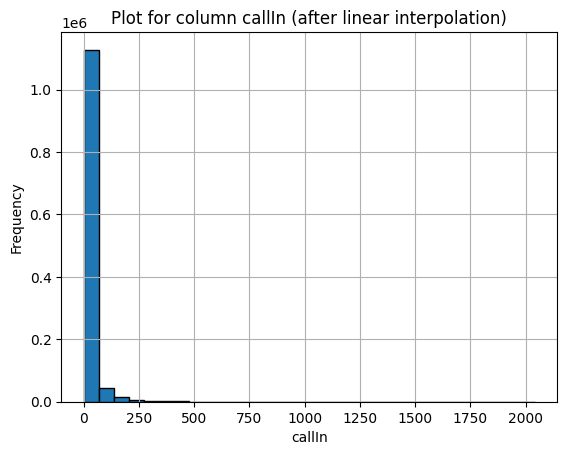

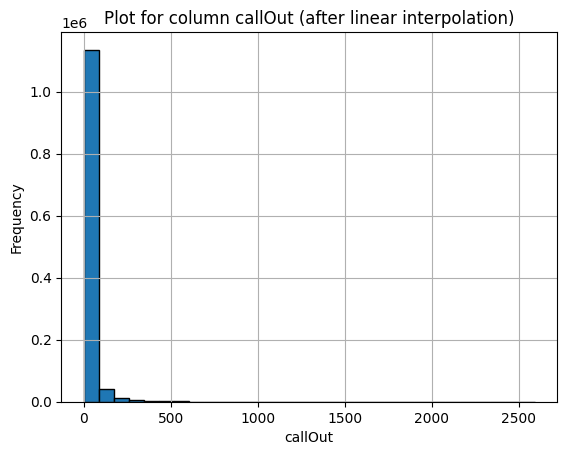

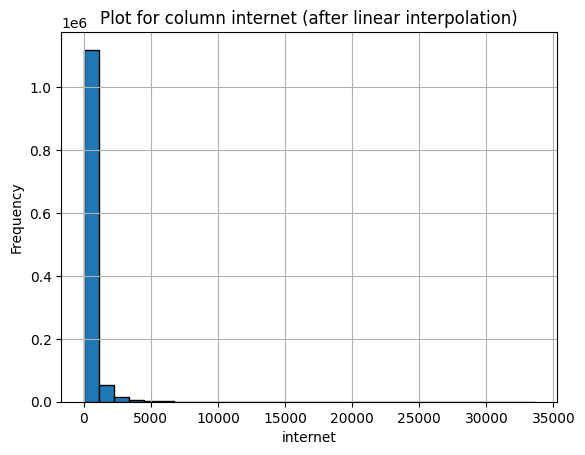

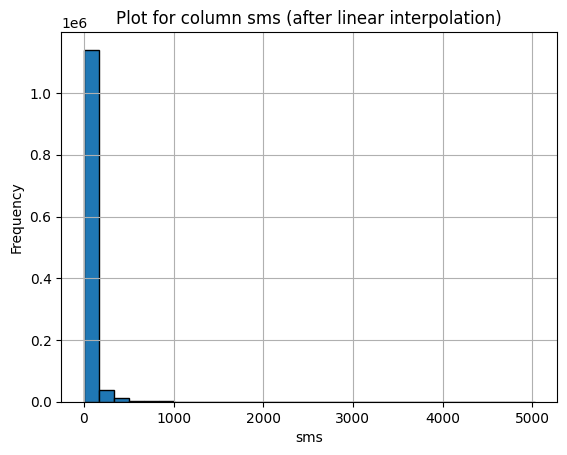

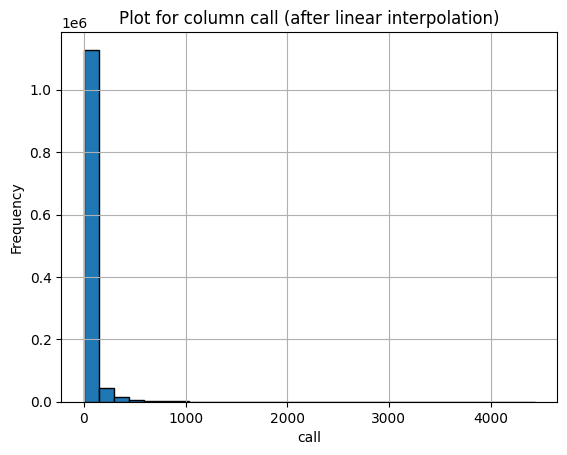


DataFrame: dailyGridActivity
 Statistics after cleaning data:
              smsIn        smsOut        callIn       callOut       internet  \
count  49990.000000  49990.000000  49990.000000  49990.000000   49990.000000   
mean     635.540343    332.071566    451.208938    523.172066    8533.494823   
std     1155.995193    630.181992    804.729796    944.101504   14669.390945   
min        0.000000      0.000000      0.000000      1.523663       0.000000   
25%      116.136176     57.772497     82.811105     94.355704    1747.840529   
50%      292.603141    143.556206    211.251461    236.761333    4064.368845   
75%      634.776175    320.066846    467.601339    535.174152    8756.536171   
max    26404.445366  15664.966273  16173.817138  20368.367004  304855.259521   

                sms          call  
count  49990.000000  49990.000000  
mean     967.611909    974.381004  
std     1748.157022   1738.605291  
min        0.000000      2.723392  
25%      175.412067    178.706727  


<ipython-input-11-bf464847b338>:23: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[columns_to_clean] = df[columns_to_clean].fillna(method='bfill').fillna(method='ffill')


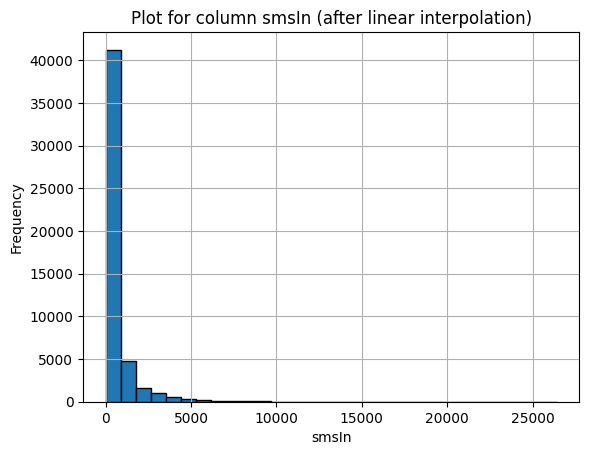

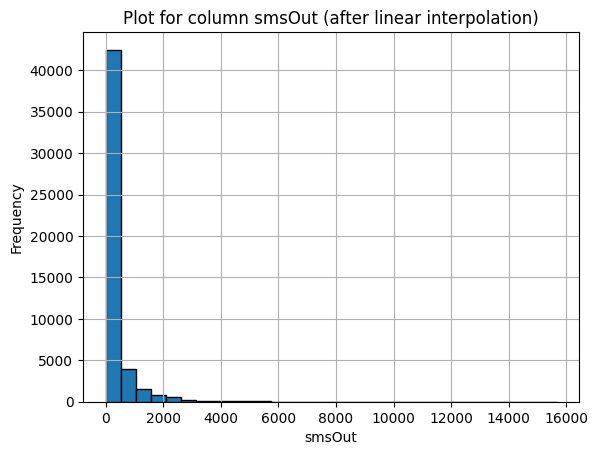

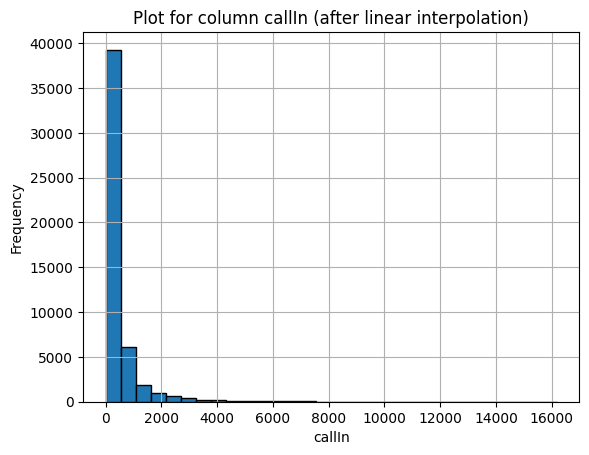

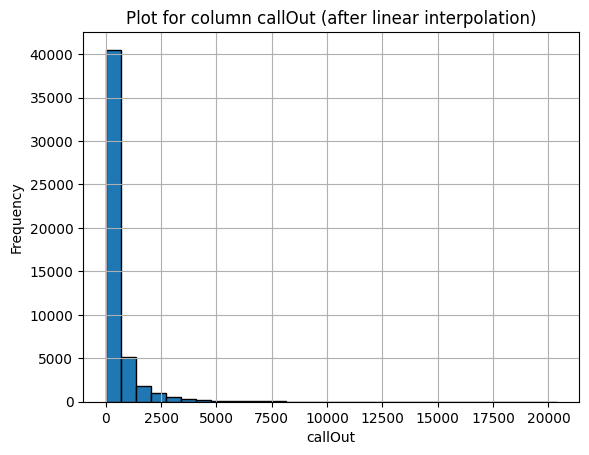

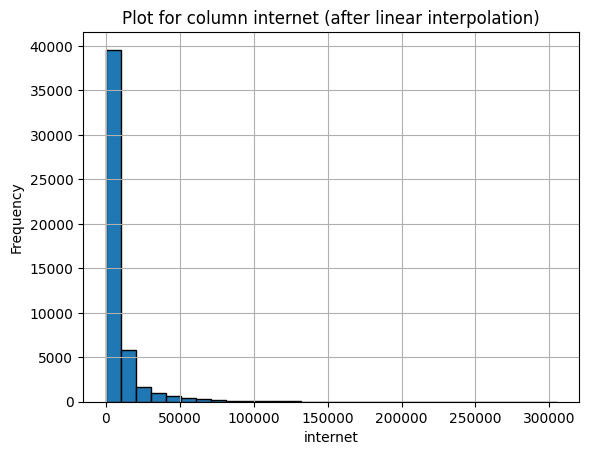

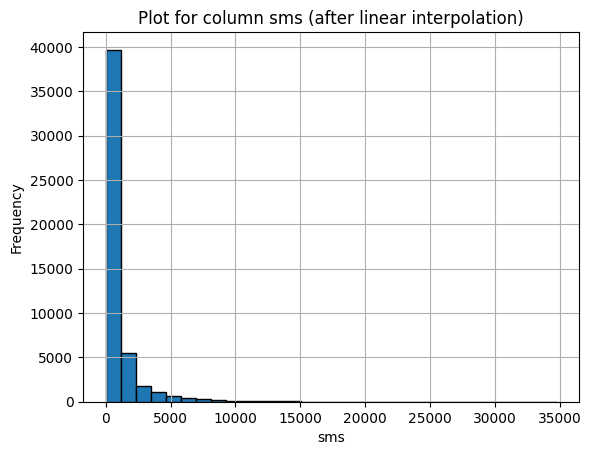

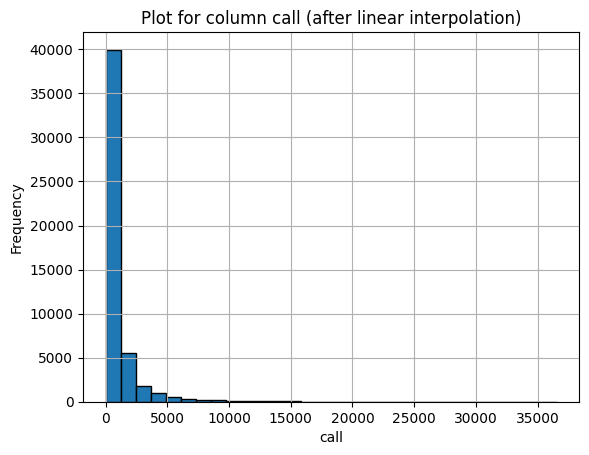


DataFrame: totalGridActivity
 Statistics after cleaning data:
               smsIn        smsOut        callIn       callOut      internet  \
count    9998.000000   9998.000000   9998.000000   9998.000000  9.998000e+03   
mean     3177.701716   1660.357830   2256.044689   2615.860330  4.266747e+04   
std      5518.278501   3010.414654   3762.156539   4434.897837  7.210940e+04   
min         0.000000      0.000000      0.000000     10.931116  0.000000e+00   
25%       609.418164    309.653011    445.124412    500.922262  8.989708e+03   
50%      1461.037090    742.775535   1078.149462   1209.712862  2.028048e+04   
75%      3220.772847   1620.693938   2353.383252   2646.547001  4.390750e+04   
max    106814.075684  66079.978110  64815.939092  79080.608437  1.189296e+06   

                 sms           call  
count    9998.000000    9998.000000  
mean     4838.059546    4871.905019  
std      8353.248931    8150.685524  
min         0.000000      20.030061  
25%       932.270975     9

<ipython-input-11-bf464847b338>:23: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df[columns_to_clean] = df[columns_to_clean].fillna(method='bfill').fillna(method='ffill')


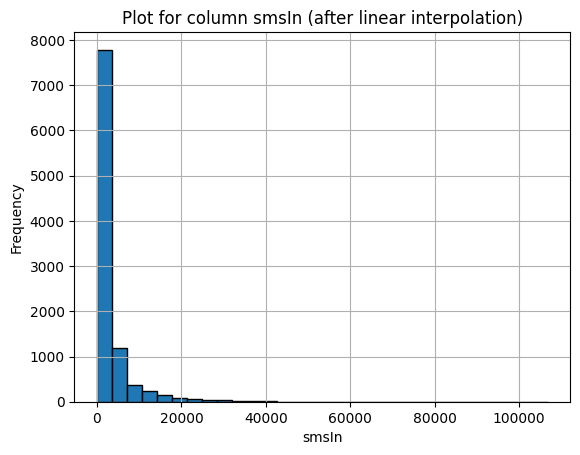

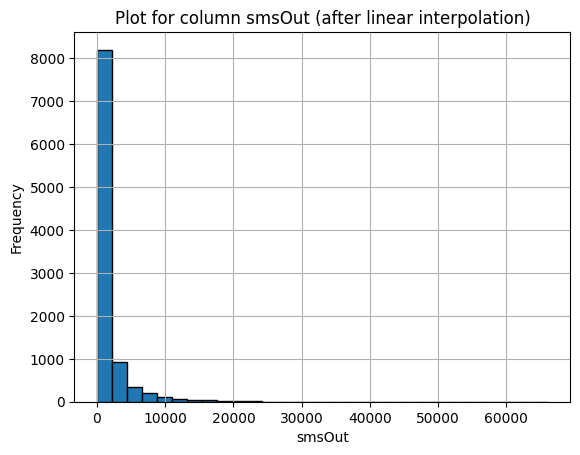

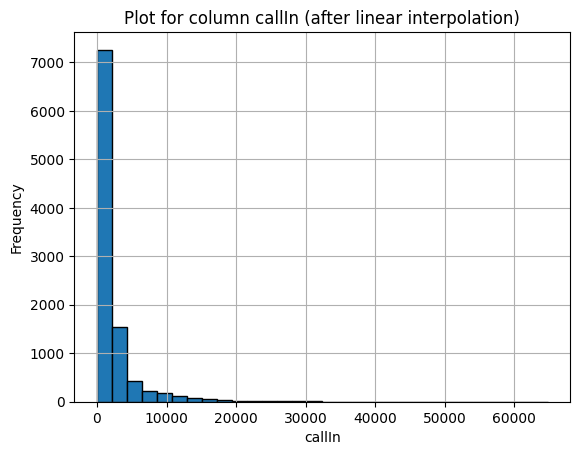

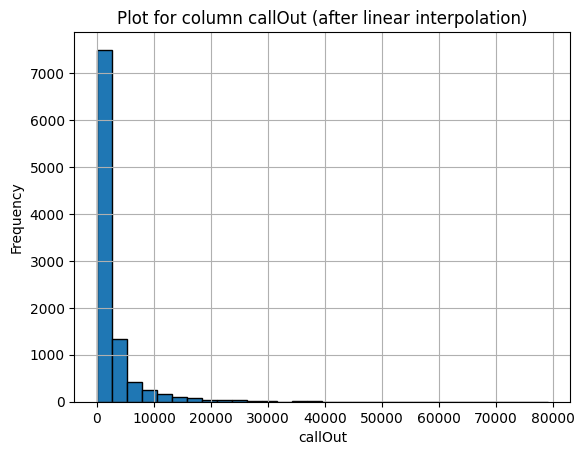

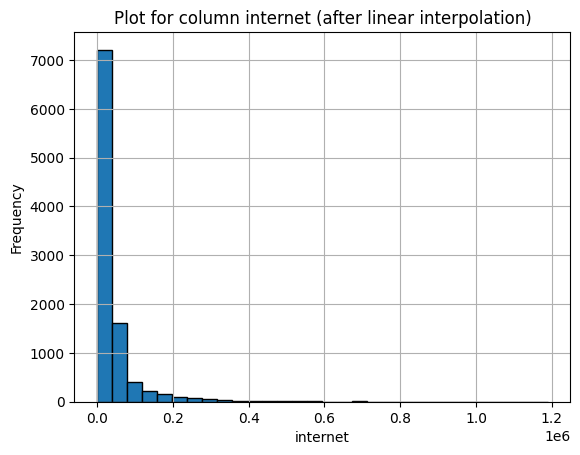

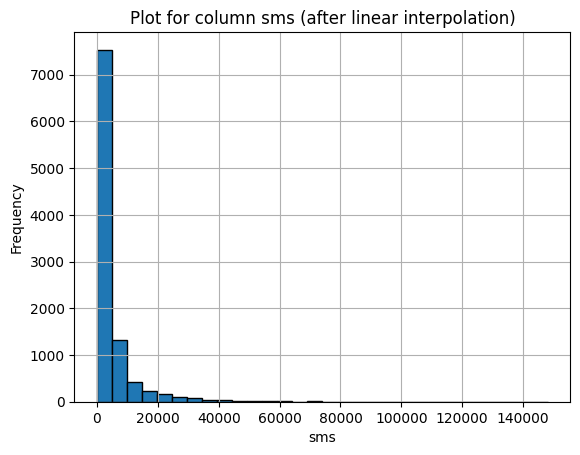

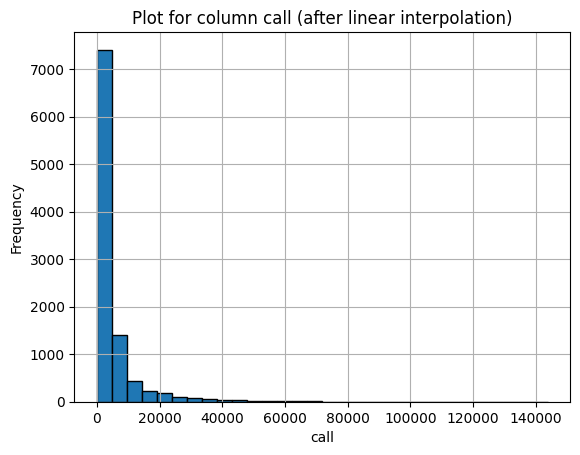

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#columns to clean
columns_to_clean = ['smsIn', 'smsOut', 'callIn', 'callOut', 'internet', 'sms', 'call']

#convert string NaN, ''
for i, df in enumerate(dfs):
  print(f"\nDataFrame: {df_names[i]}")
  for column in columns_to_clean:
      df[column] = df[column].replace(['NaN', '', ' '], np.nan)
      df[column] = pd.to_numeric(df[column], errors='coerce')

  #sort by time values
  if 'datetime' in df.columns:
      df = df.sort_values(by='datetime')

  #linear interpolation
  df[columns_to_clean] = df[columns_to_clean].interpolate(method='linear')

  #forward/backward fill for NaN lvalues left
  df[columns_to_clean] = df[columns_to_clean].fillna(method='bfill').fillna(method='ffill')

  print(" Statistics after cleaning data:")
  print(df[columns_to_clean].describe())

  #show plots
  for column in columns_to_clean:
      plt.figure()
      plt.hist(df[column], bins=30, edgecolor='black')
      plt.title(f"Plot for column {column} (after linear interpolation)")
      plt.xlabel(column)
      plt.ylabel("Frequency")
      plt.grid(True)
      plt.show()

In [12]:
#Display rows with NaN values
for df in dfs:
  print(df[df.isna().any(axis=1)])

Empty DataFrame
Columns: [smsIn, smsOut, callIn, callOut, internet, sms, call]
Index: []
Empty DataFrame
Columns: [smsIn, smsOut, callIn, callOut, internet, sms, call]
Index: []
Empty DataFrame
Columns: [smsIn, smsOut, callIn, callOut, internet, sms, call]
Index: []


**Έλεγχος Αν Ακολουθεί Κανονική Κατανομή**

Kolmogorov-Smirnov Test:


DataFrame: hourlyGridActivity
smsIn: Non-Normal Distribution (p = 0.0000)


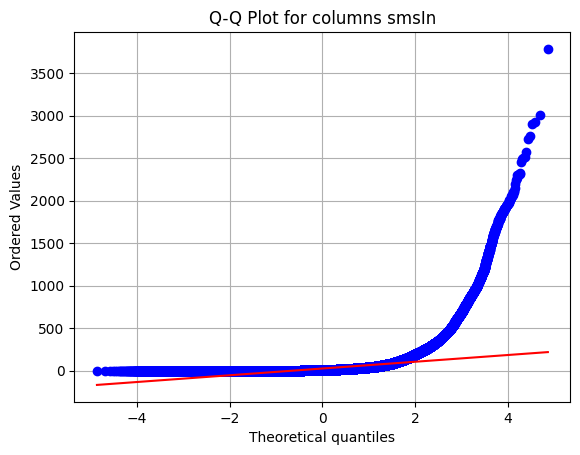

smsOut: Non-Normal Distribution (p = 0.0000)


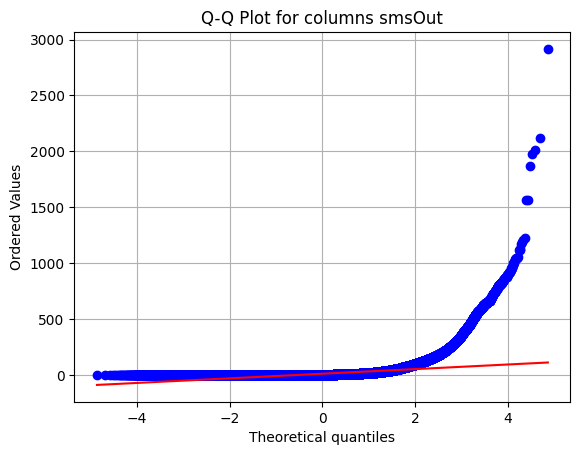

callIn: Non-Normal Distribution (p = 0.0000)


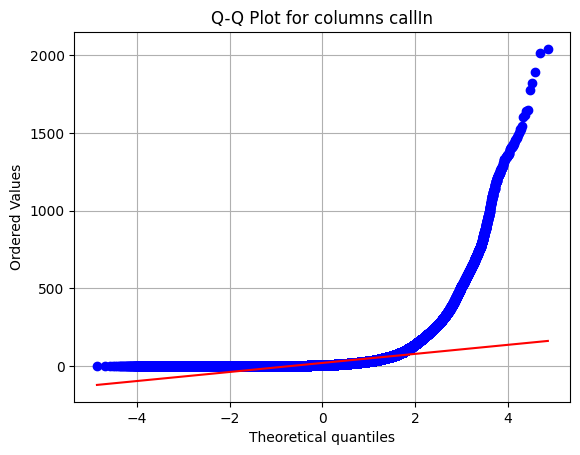

callOut: Non-Normal Distribution (p = 0.0000)


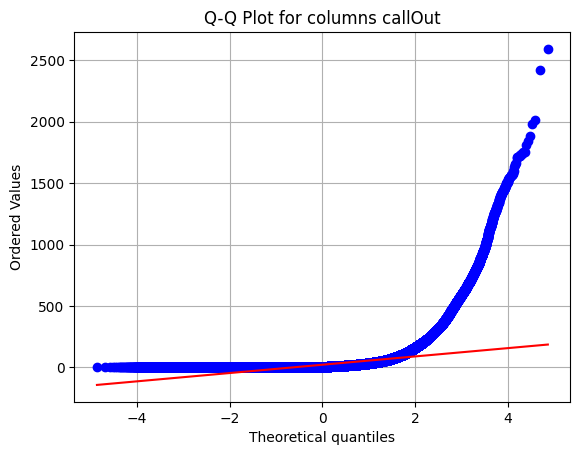

internet: Non-Normal Distribution (p = 0.0000)


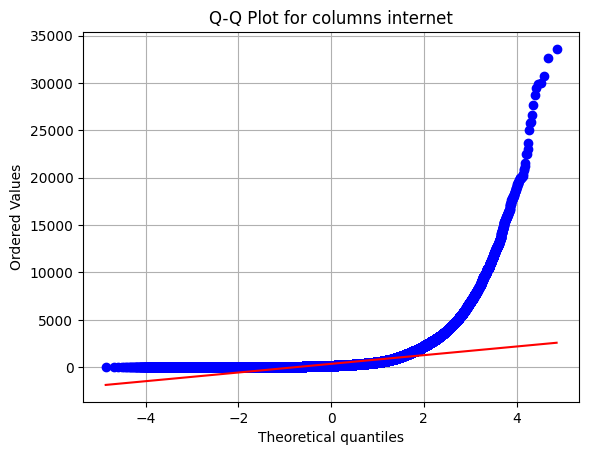

sms: Non-Normal Distribution (p = 0.0000)


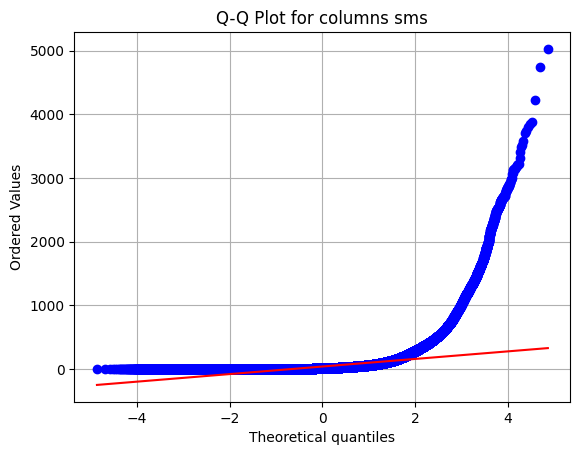

call: Non-Normal Distribution (p = 0.0000)


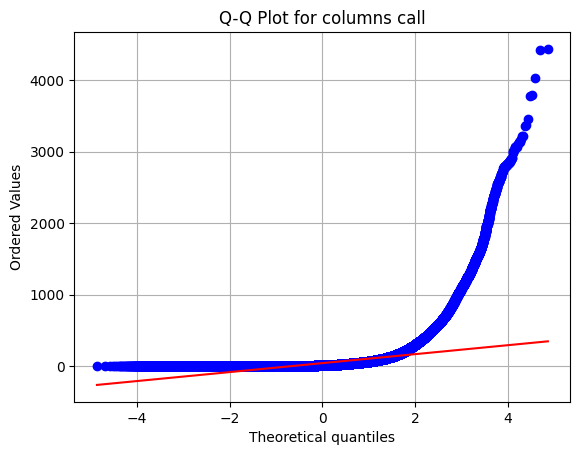


DataFrame: dailyGridActivity
smsIn: Non-Normal Distribution (p = 0.0000)


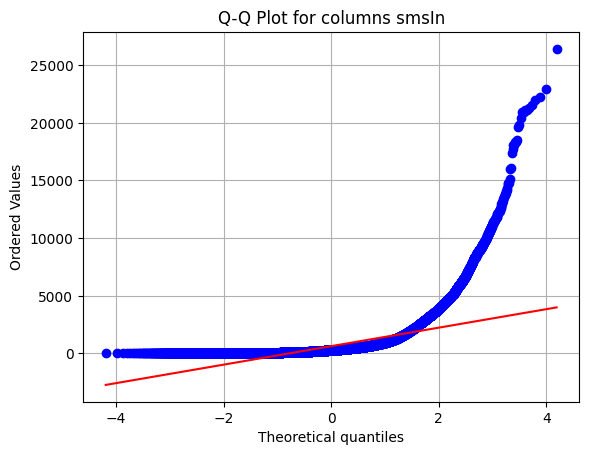

smsOut: Non-Normal Distribution (p = 0.0000)


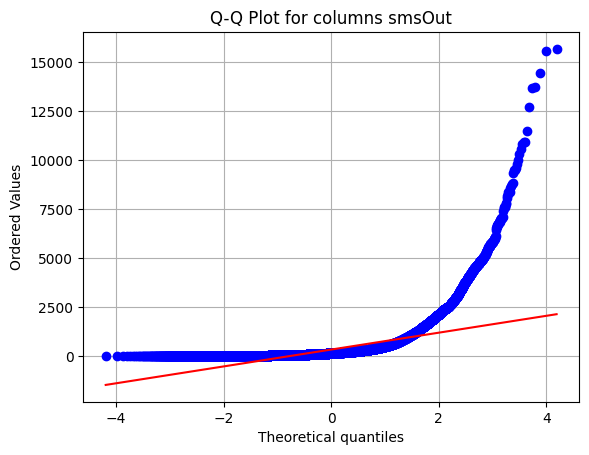

callIn: Non-Normal Distribution (p = 0.0000)


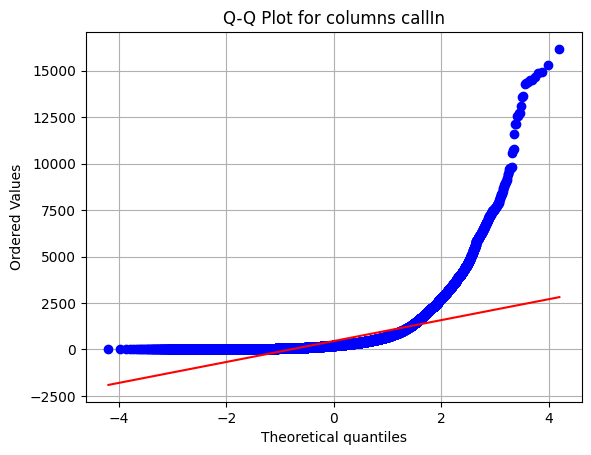

callOut: Non-Normal Distribution (p = 0.0000)


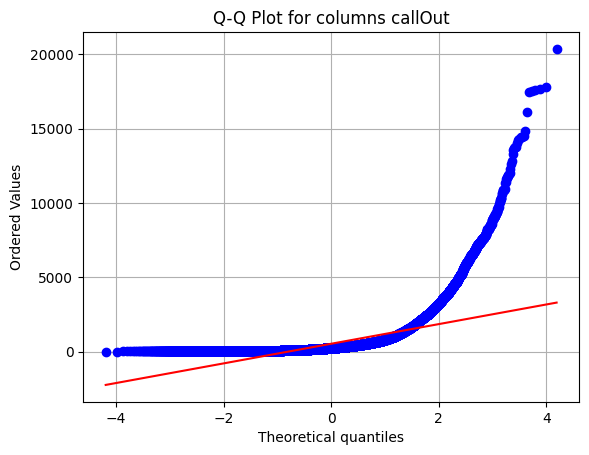

internet: Non-Normal Distribution (p = 0.0000)


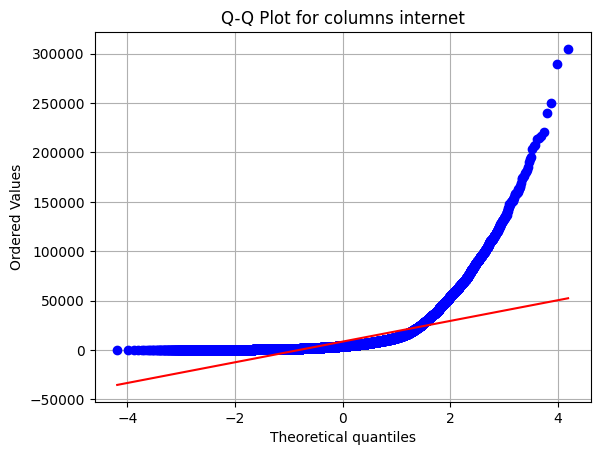

sms: Non-Normal Distribution (p = 0.0000)


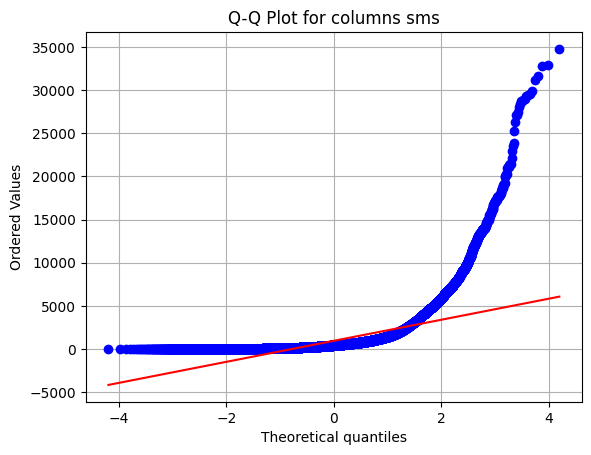

call: Non-Normal Distribution (p = 0.0000)


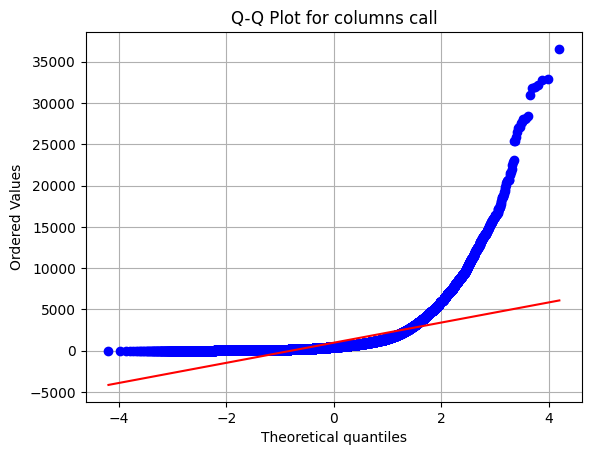


DataFrame: totalGridActivity
smsIn: Non-Normal Distribution (p = 0.0000)


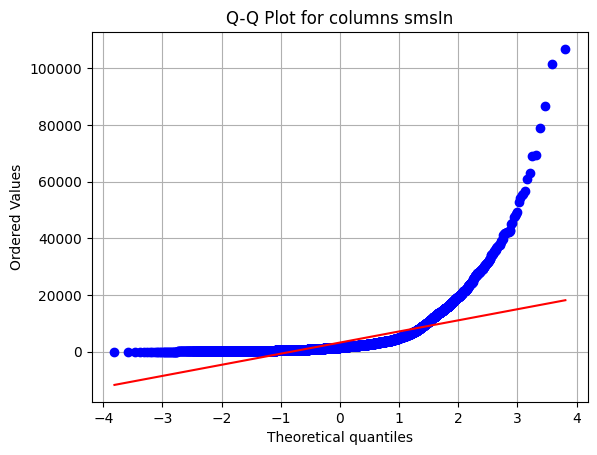

smsOut: Non-Normal Distribution (p = 0.0000)


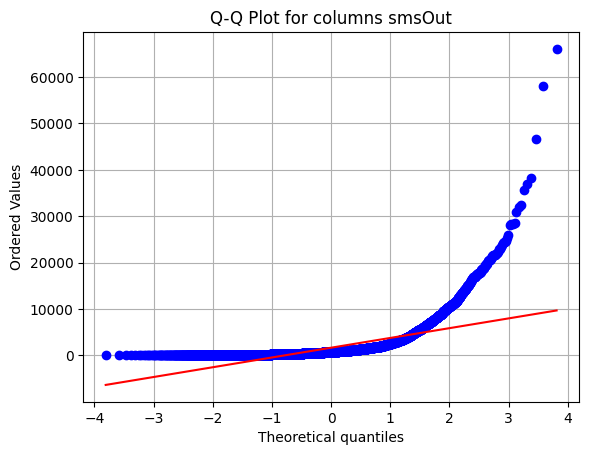

callIn: Non-Normal Distribution (p = 0.0000)


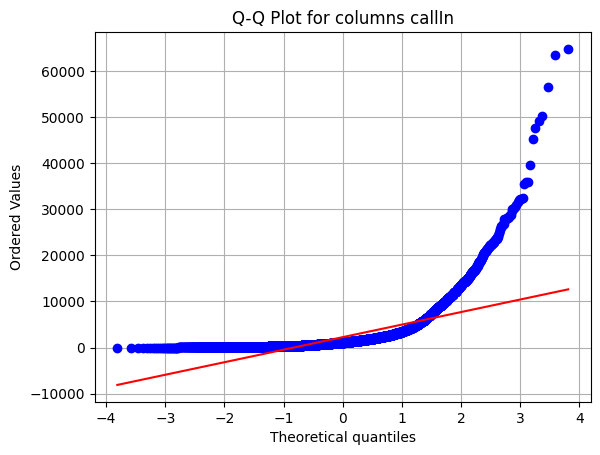

callOut: Non-Normal Distribution (p = 0.0000)


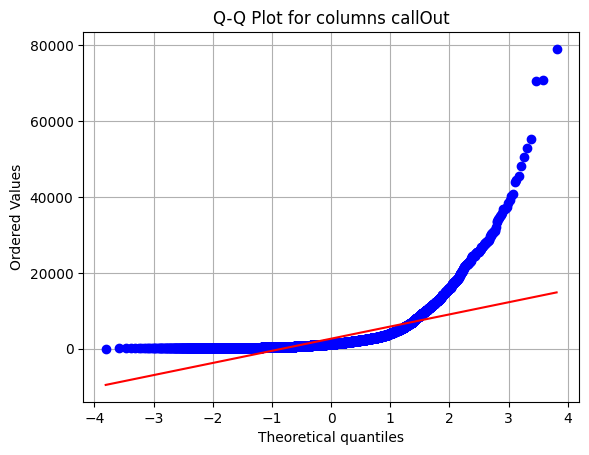

internet: Non-Normal Distribution (p = 0.0000)


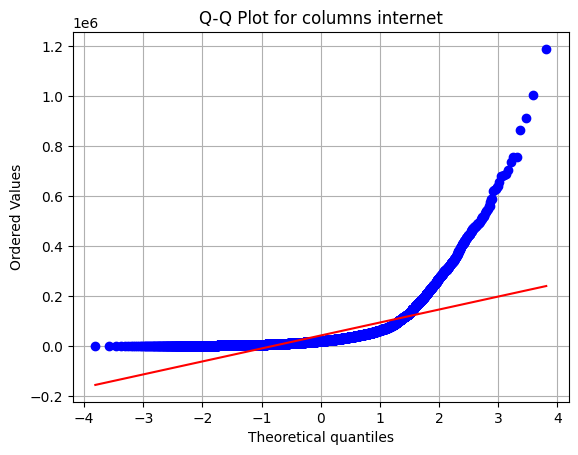

sms: Non-Normal Distribution (p = 0.0000)


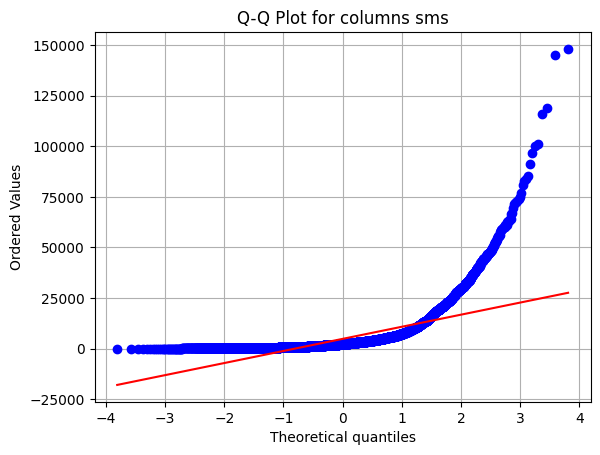

call: Non-Normal Distribution (p = 0.0000)


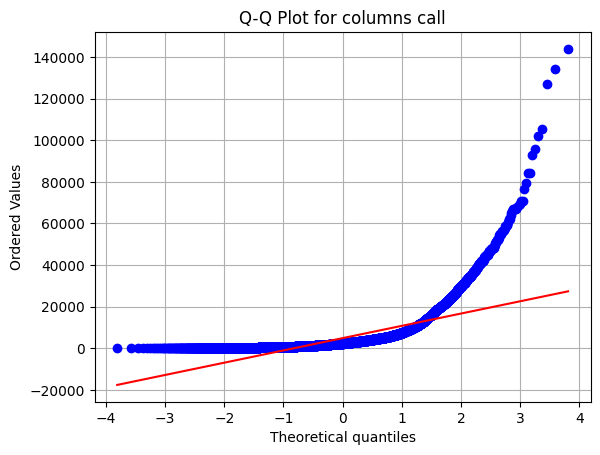

In [13]:
from scipy.stats import kstest, zscore, probplot
import matplotlib.pyplot as plt
import pandas as pd

#columns to test
columns_to_test = ['smsIn', 'smsOut', 'callIn', 'callOut', 'internet', 'sms', 'call']

print("Kolmogorov-Smirnov Test:\n")

for i, df in enumerate(dfs):
  print(f"\nDataFrame: {df_names[i]}")
  for col in columns_to_test:
    col_data = df[col].dropna()

    # Standardization z-score
    standardized = zscore(col_data)

    # Kolmogorov-Smirnov Test
    stat, p = kstest(standardized, 'norm')
    if p > 0.05:
        print(f"{col}: Normal Distribution (p = {p:.4f})")
    else:
        print(f"{col}: Non-Normal Distribution (p = {p:.4f})")

    # Q-Q Plot
    probplot(col_data, dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for columns {col}")
    plt.grid(True)
    plt.show()

**Εφαρμογή log1p Για Βελτίωση Της Κατανομής**


DataFrame: hourlyGridActivity


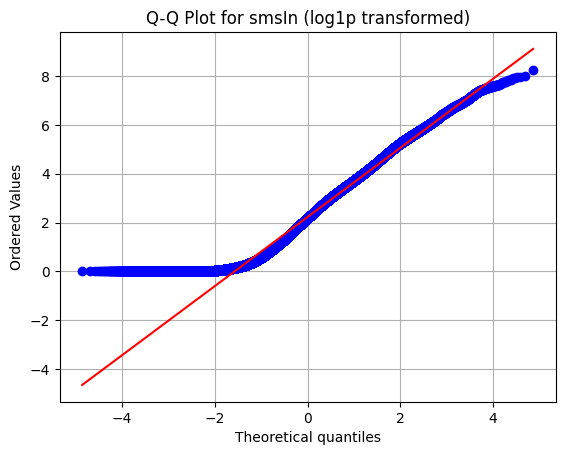

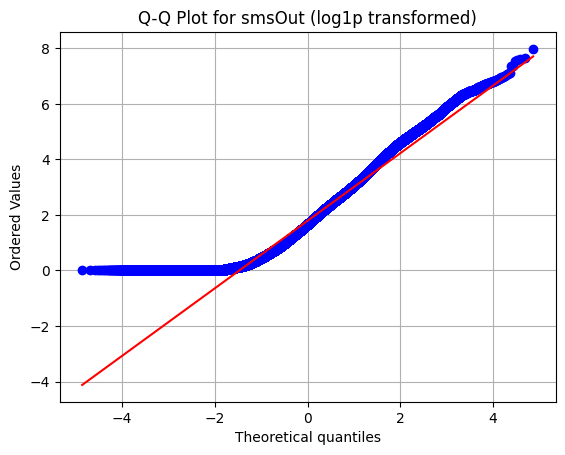

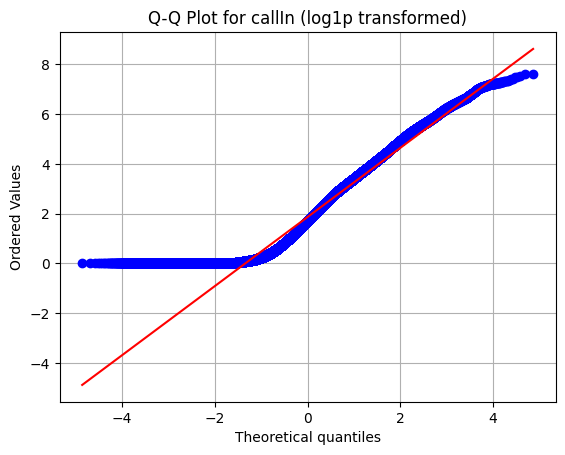

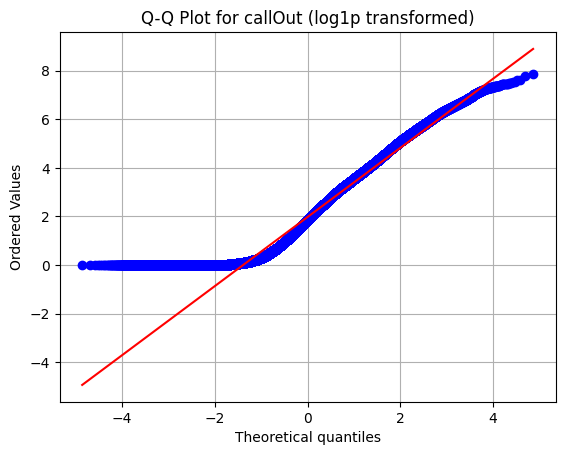

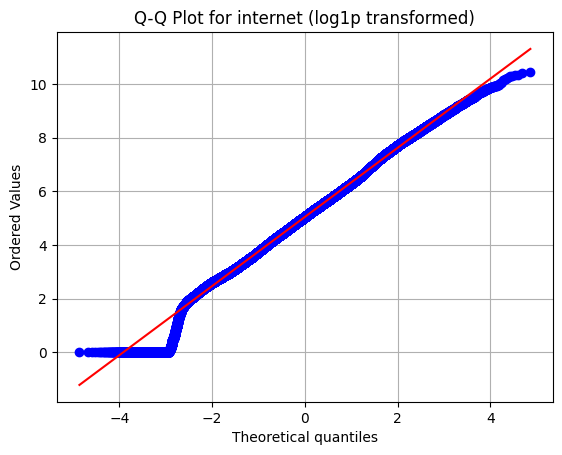

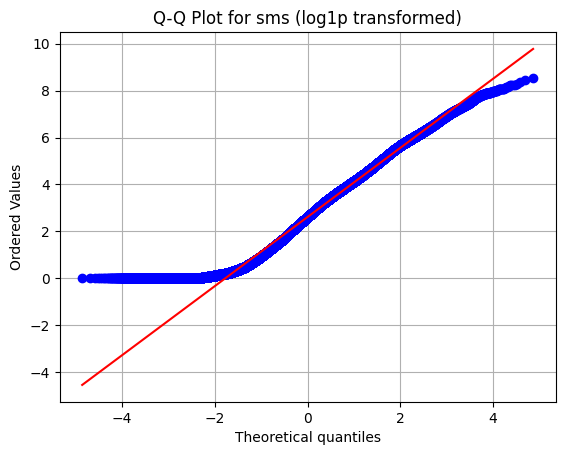

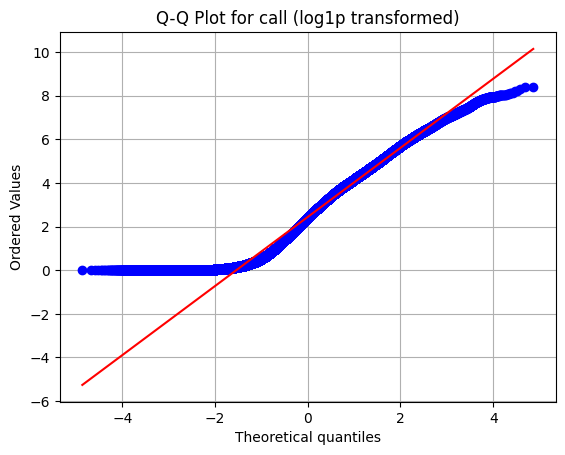


DataFrame: dailyGridActivity


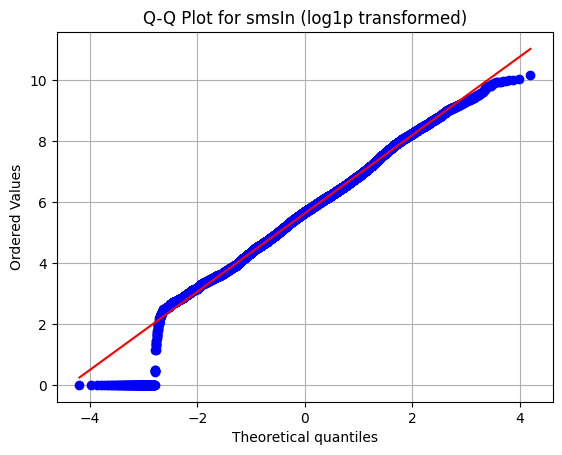

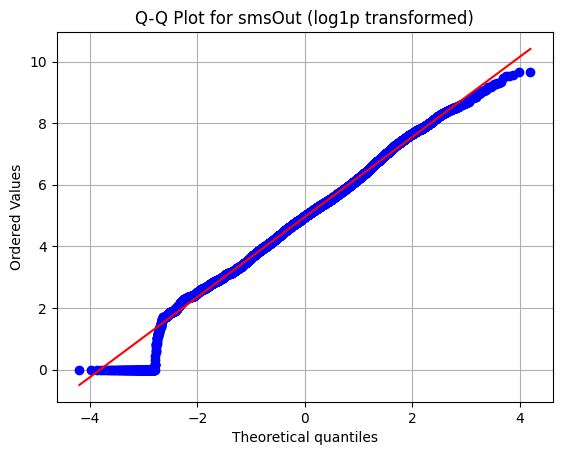

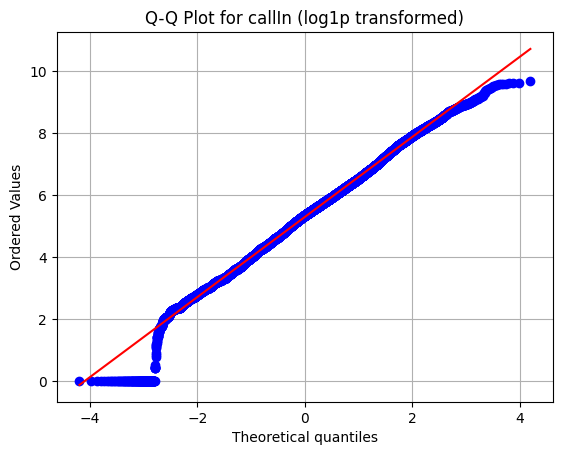

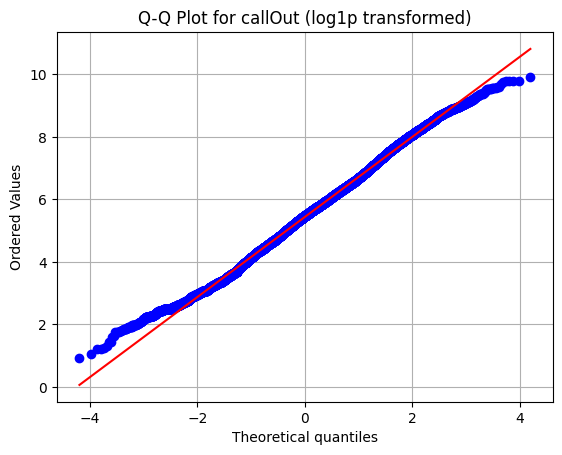

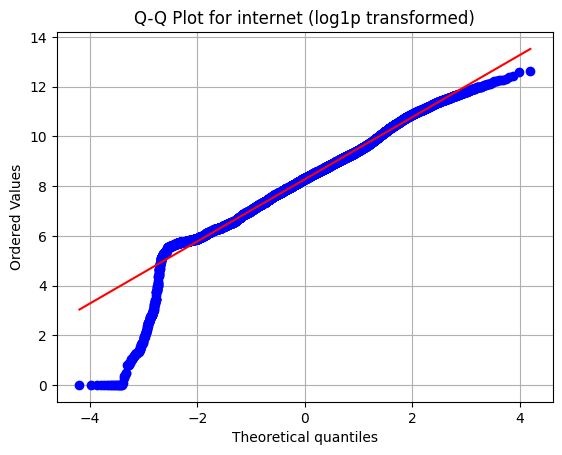

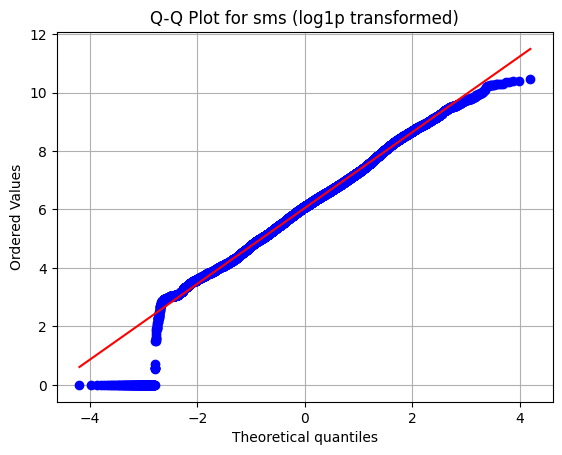

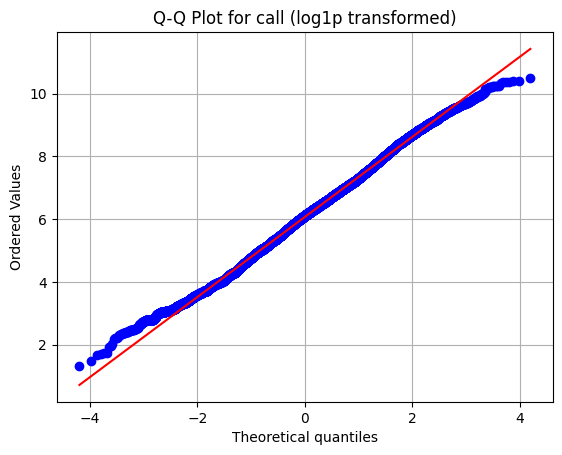


DataFrame: totalGridActivity


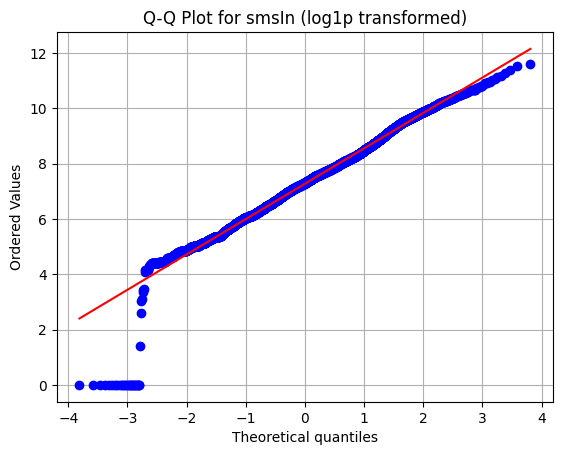

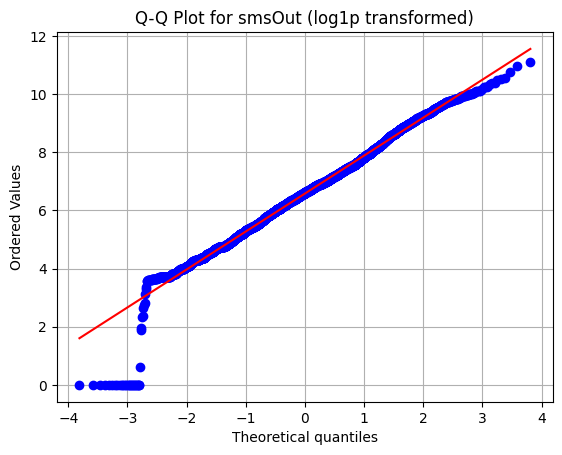

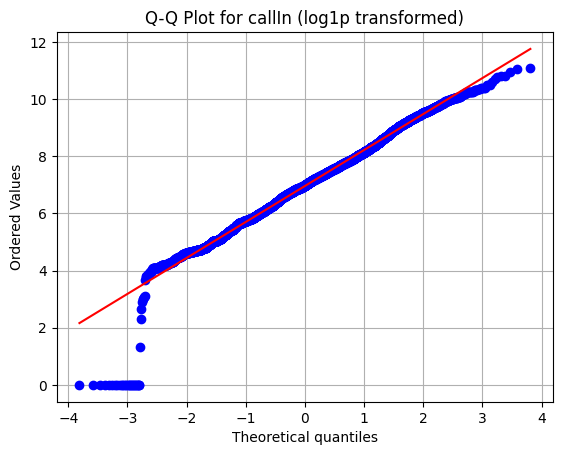

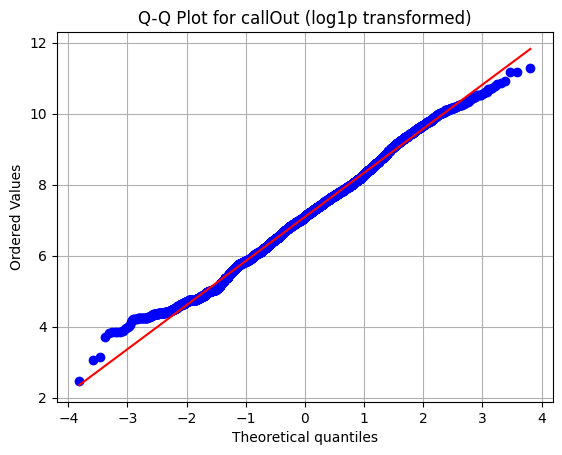

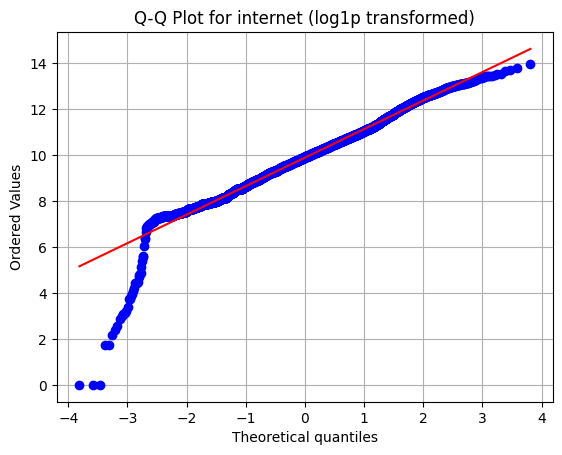

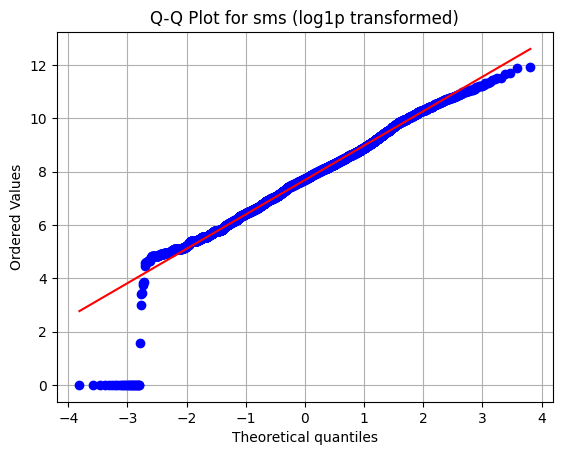

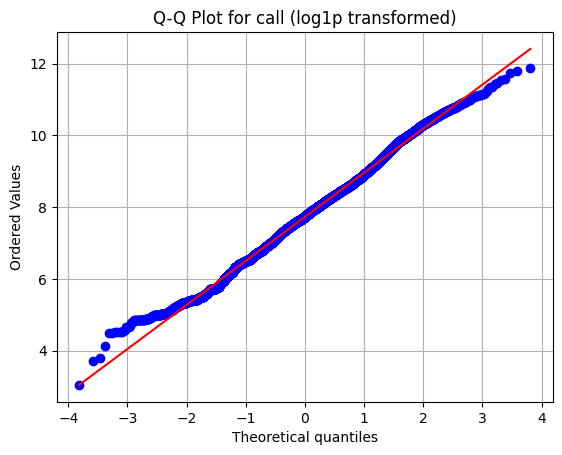

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

#columns to transform
columns_to_transform = ['smsIn', 'smsOut', 'callIn', 'callOut', 'internet', 'sms', 'call']

#log1p for each column
for i, df in enumerate(dfs):
  print(f"\nDataFrame: {df_names[i]}")
  for col in columns_to_transform:
    df[f'{col}_log'] = np.log1p(df[col])

  #Q-Q plots
  for col in columns_to_transform:
      plt.figure()
      stats.probplot(df[f'{col}_log'].dropna(), dist="norm", plot=plt)
      plt.title(f"Q-Q Plot for {col} (log1p transformed)")
      plt.grid(True)
      plt.show()

**Εφαρμογή Capping Για Τα Outliers**


DataFrame: hourlyGridActivity
 Statistics BEFORE capping:
              smsIn        smsOut        callIn       callOut      internet
count  1.199674e+06  1.199674e+06  1.199674e+06  1.199674e+06  1.199674e+06
mean   2.648275e+01  1.383731e+01  1.880172e+01  2.180040e+01  3.555878e+02
std    6.461727e+01  3.343718e+01  4.735225e+01  5.494388e+01  6.864354e+02
min    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00
25%    1.801180e+00  1.169199e+00  7.519982e-01  9.651237e-01  6.520593e+01
50%    7.895058e+00  4.275592e+00  4.619692e+00  5.493261e+00  1.551229e+02
75%    2.532524e+01  1.270770e+01  1.790385e+01  2.044054e+01  3.561041e+02
max    3.786154e+03  2.916129e+03  2.041425e+03  2.593100e+03  3.360687e+04


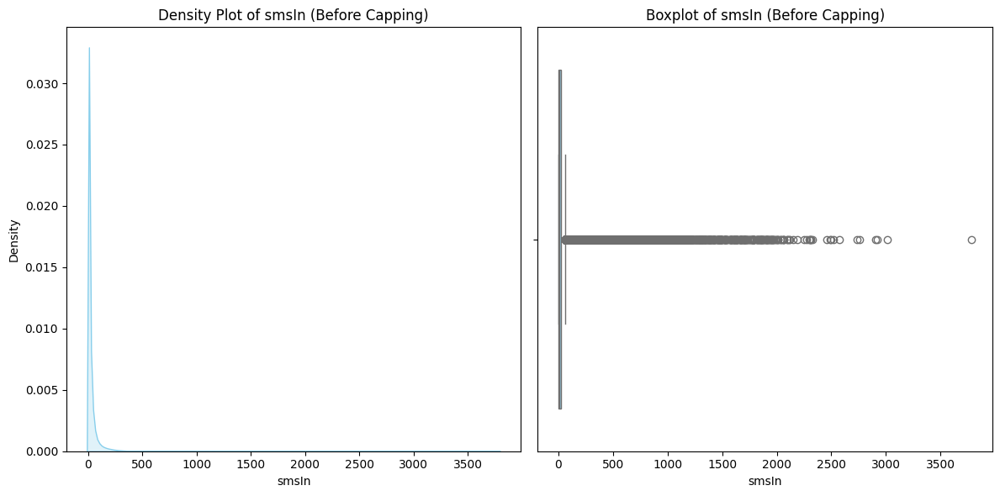


 Στήλη: smsIn
Q1 = 1.80, Q3 = 25.33, IQR = 23.52
Capping layouts: [-33.48, 60.61]


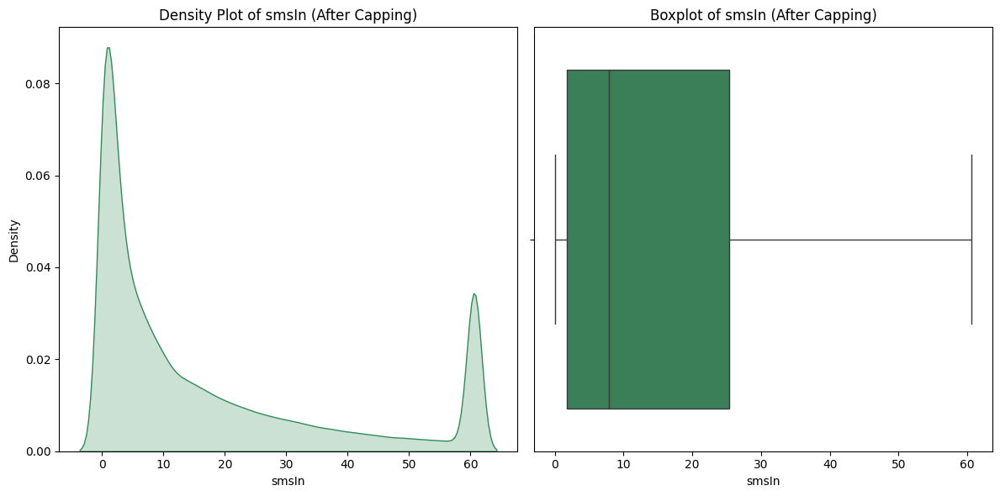

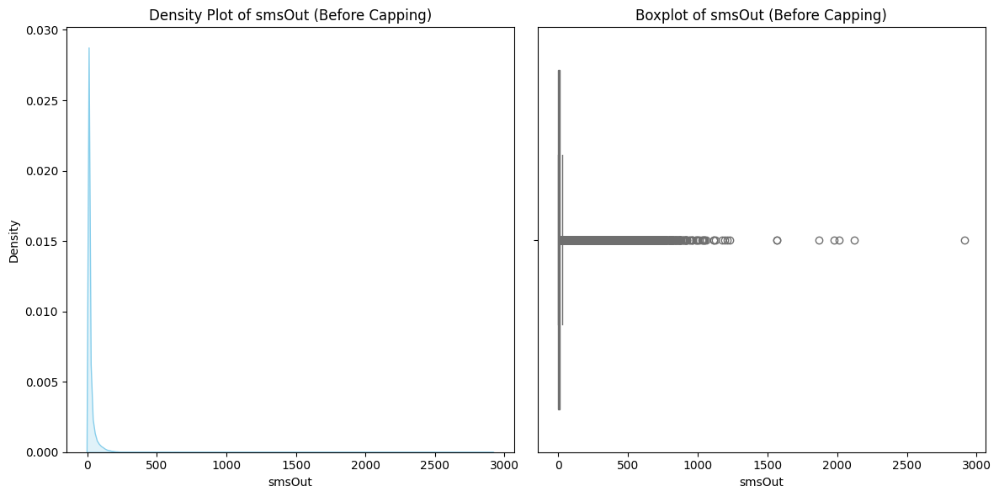


 Στήλη: smsOut
Q1 = 1.17, Q3 = 12.71, IQR = 11.54
Capping layouts: [-16.14, 30.02]


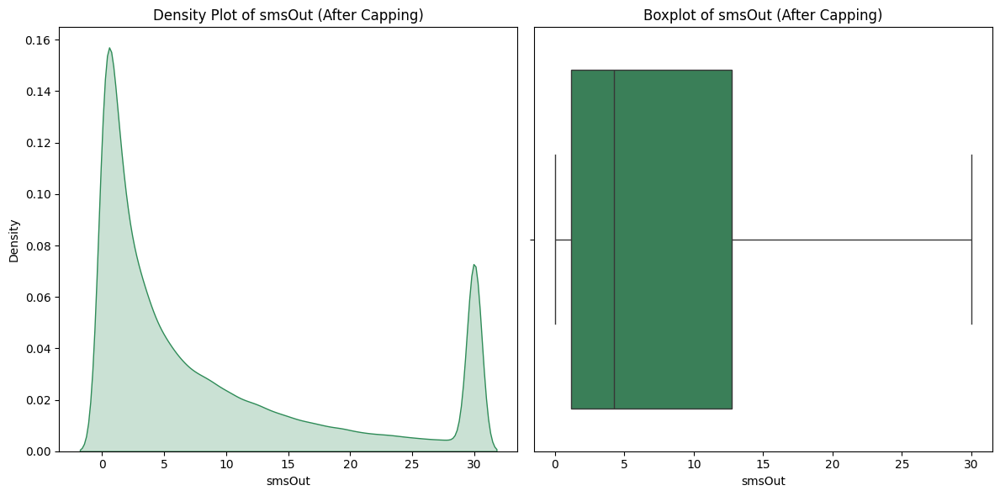

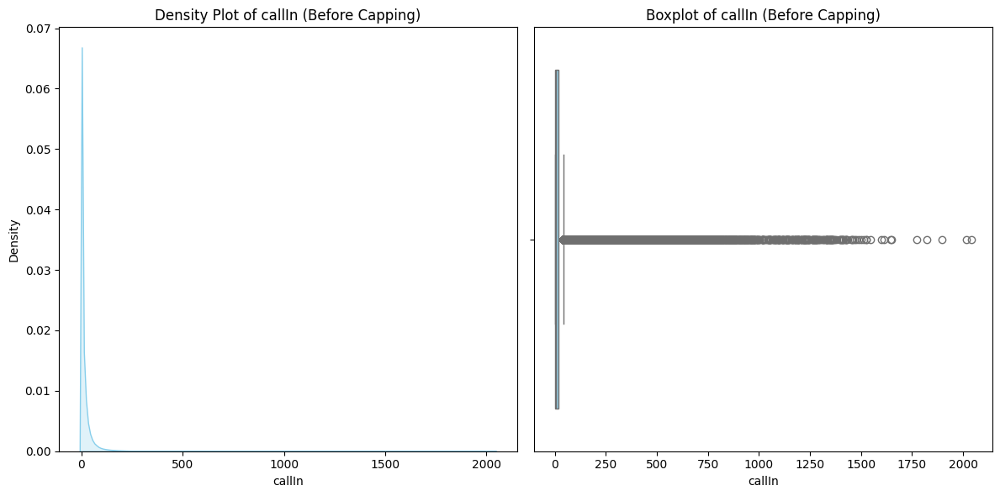


 Στήλη: callIn
Q1 = 0.75, Q3 = 17.90, IQR = 17.15
Capping layouts: [-24.98, 43.63]


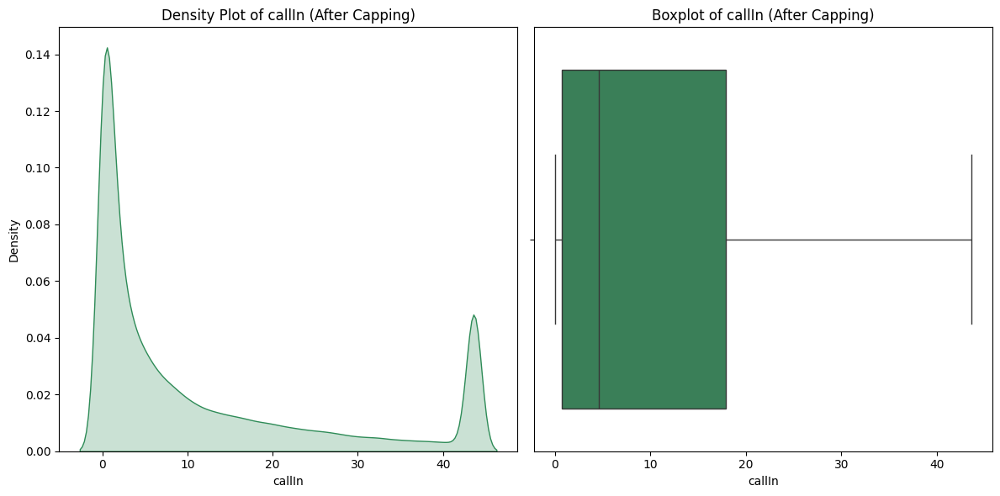

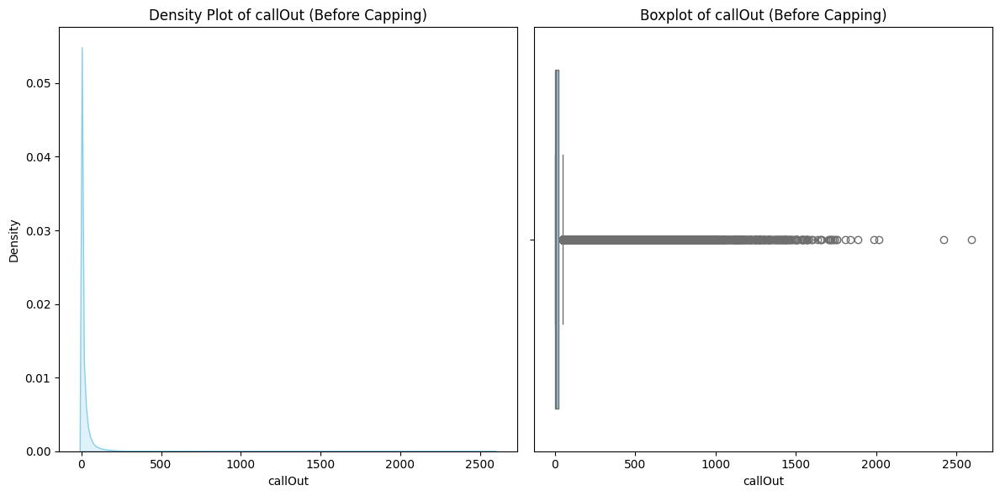


 Στήλη: callOut
Q1 = 0.97, Q3 = 20.44, IQR = 19.48
Capping layouts: [-28.25, 49.65]


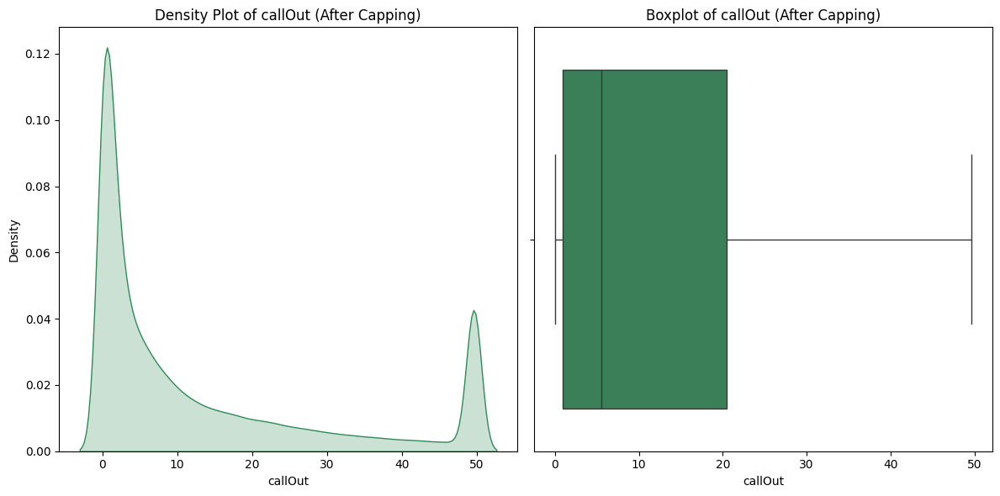

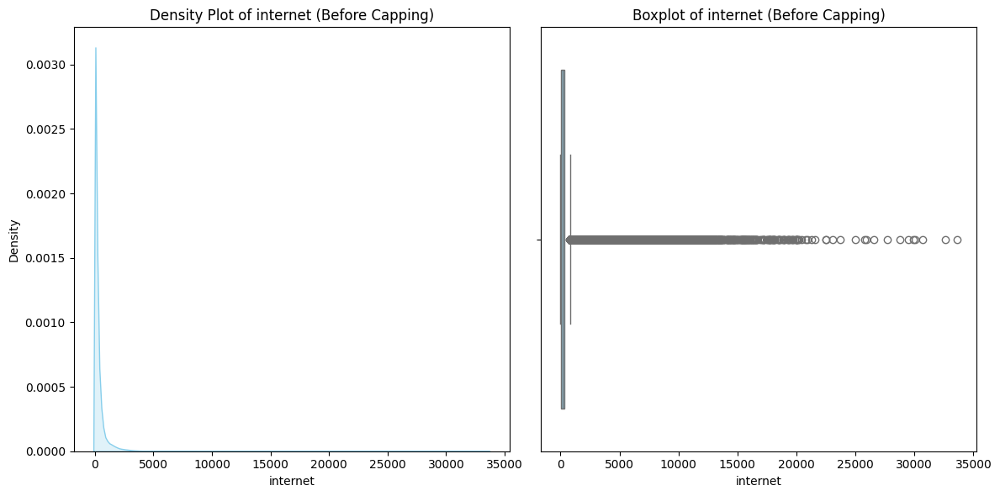


 Στήλη: internet
Q1 = 65.21, Q3 = 356.10, IQR = 290.90
Capping layouts: [-371.14, 792.45]


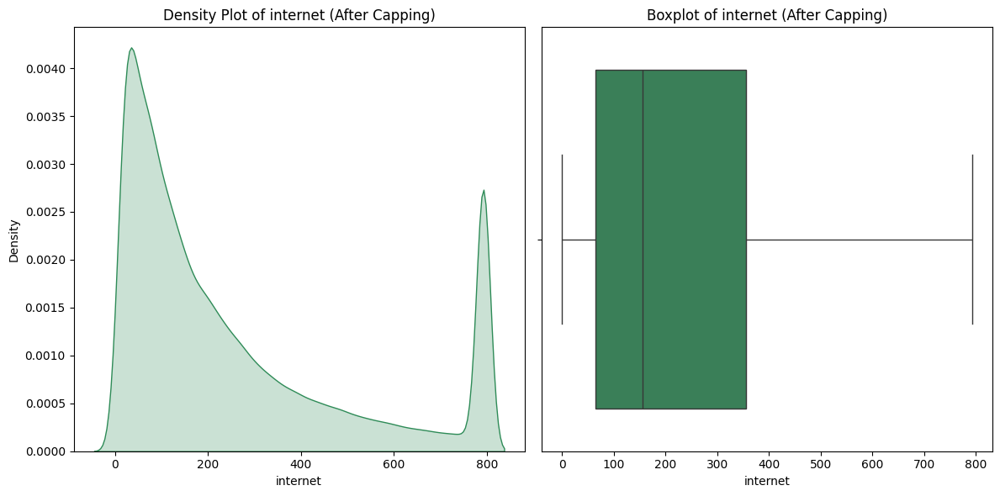


 Statistics AFTER capping:
              smsIn        smsOut        callIn       callOut      internet
count  1.199674e+06  1.199674e+06  1.199674e+06  1.199674e+06  1.199674e+06
mean   1.688113e+01  8.620943e+00  1.169258e+01  1.340362e+01  2.516106e+02
std    1.977447e+01  9.789430e+00  1.452971e+01  1.650457e+01  2.452013e+02
min    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00
25%    1.801180e+00  1.169199e+00  7.519982e-01  9.651237e-01  6.520593e+01
50%    7.895058e+00  4.275592e+00  4.619692e+00  5.493261e+00  1.551229e+02
75%    2.532524e+01  1.270770e+01  1.790385e+01  2.044054e+01  3.561041e+02
max    6.061133e+01  3.001545e+01  4.363164e+01  4.965367e+01  7.924513e+02

DataFrame: dailyGridActivity
 Statistics BEFORE capping:
              smsIn        smsOut        callIn       callOut       internet
count  49990.000000  49990.000000  49990.000000  49990.000000   49990.000000
mean     635.540343    332.071566    451.208938    523.172066    8533.494823

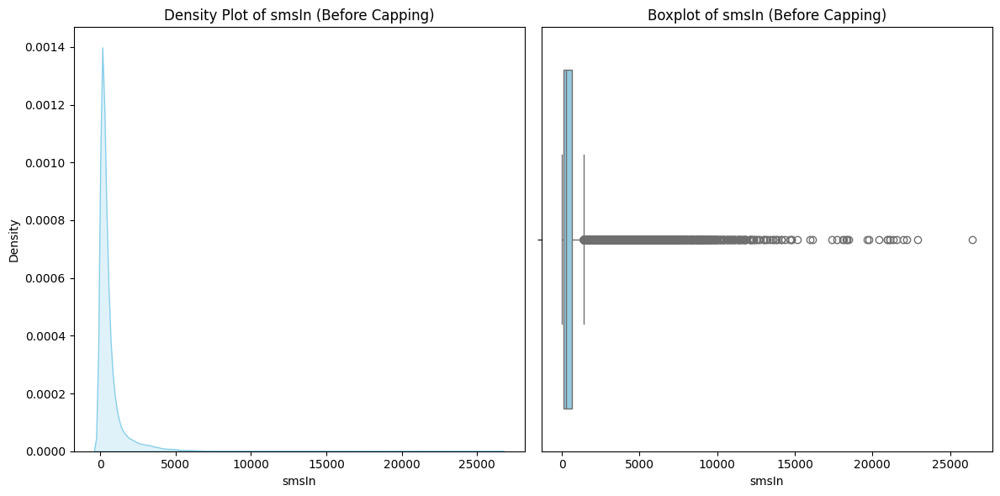


 Στήλη: smsIn
Q1 = 116.14, Q3 = 634.78, IQR = 518.64
Capping layouts: [-661.82, 1412.74]


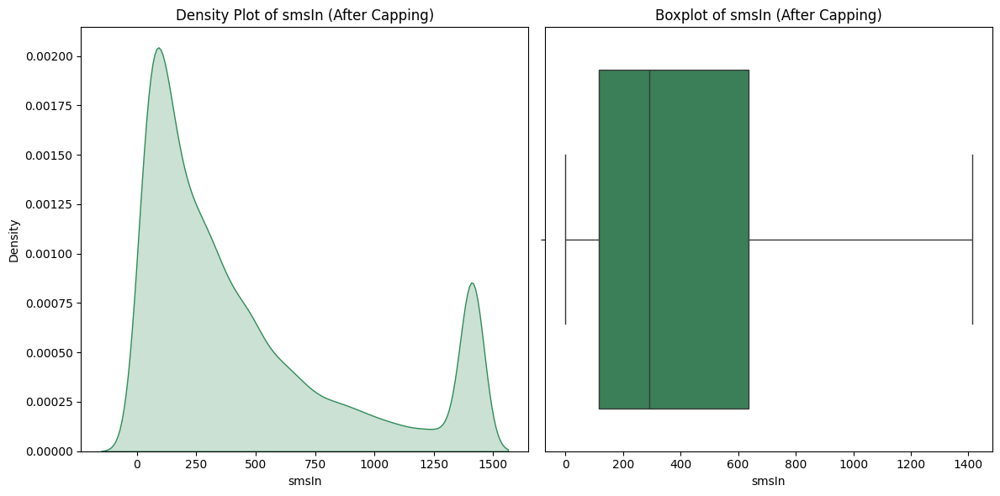

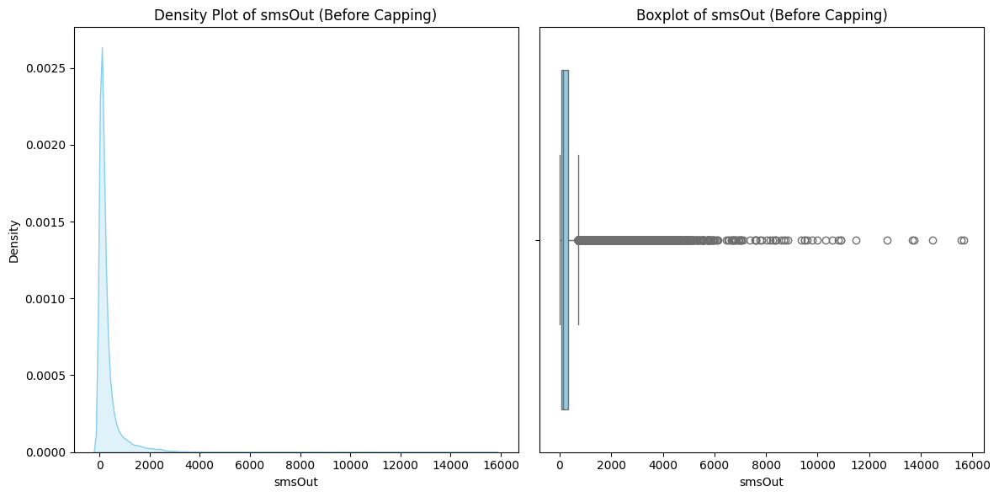


 Στήλη: smsOut
Q1 = 57.77, Q3 = 320.07, IQR = 262.29
Capping layouts: [-335.67, 713.51]


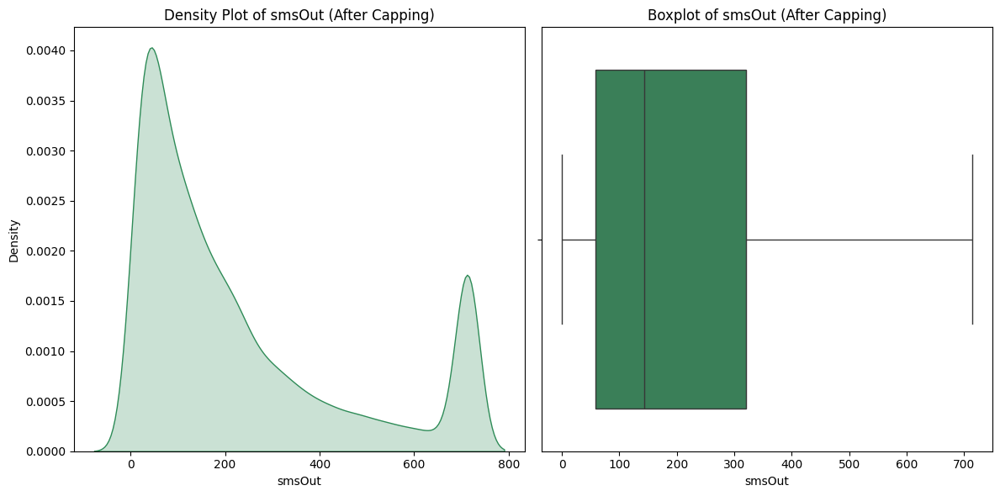

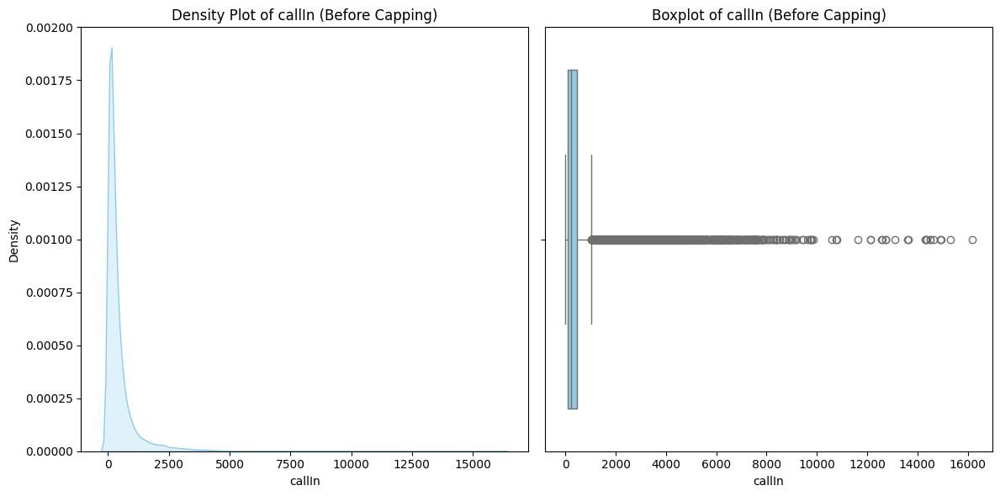


 Στήλη: callIn
Q1 = 82.81, Q3 = 467.60, IQR = 384.79
Capping layouts: [-494.37, 1044.79]


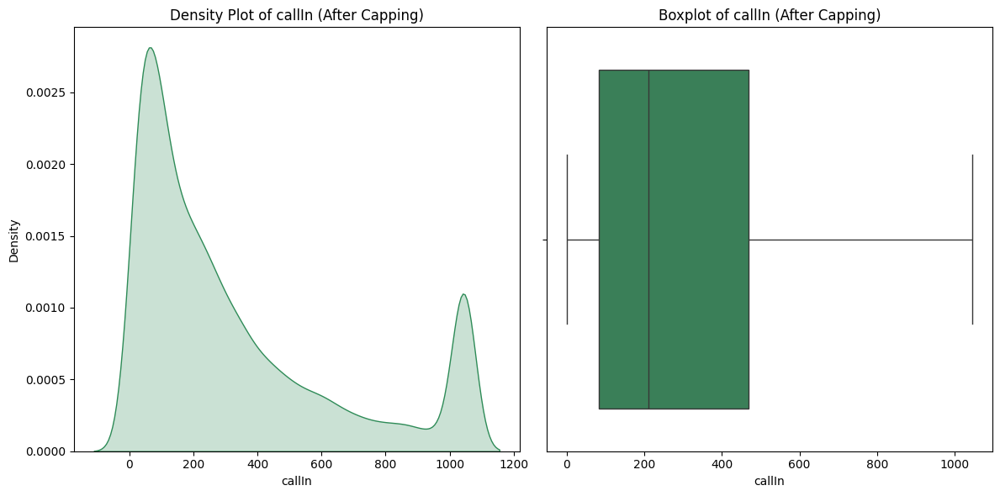

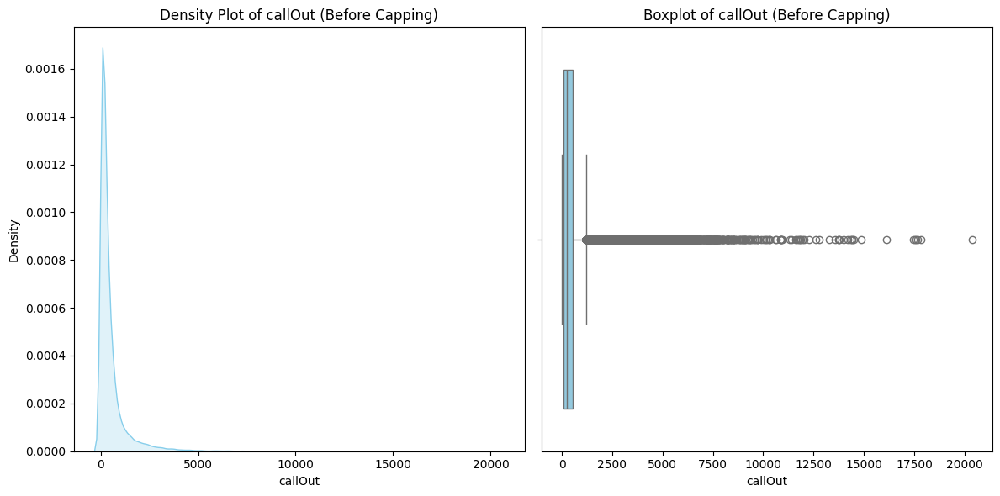


 Στήλη: callOut
Q1 = 94.36, Q3 = 535.17, IQR = 440.82
Capping layouts: [-566.87, 1196.40]


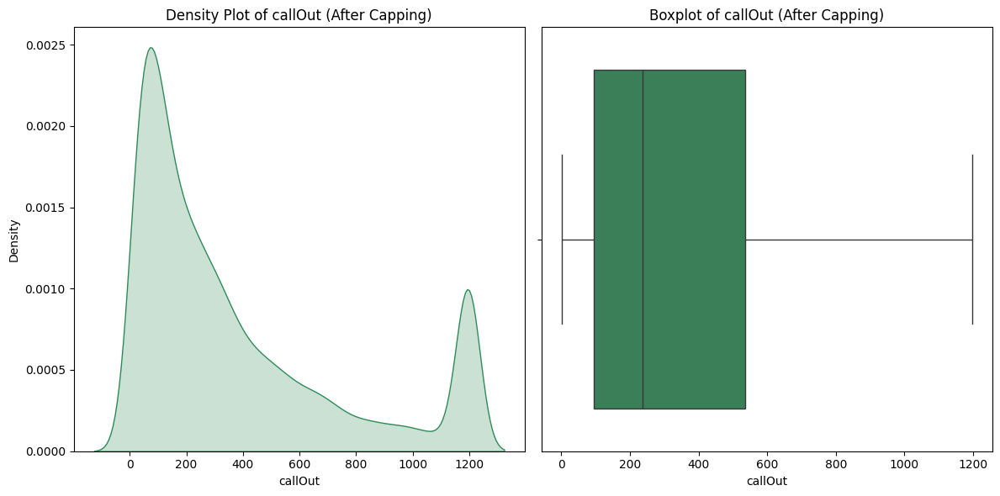

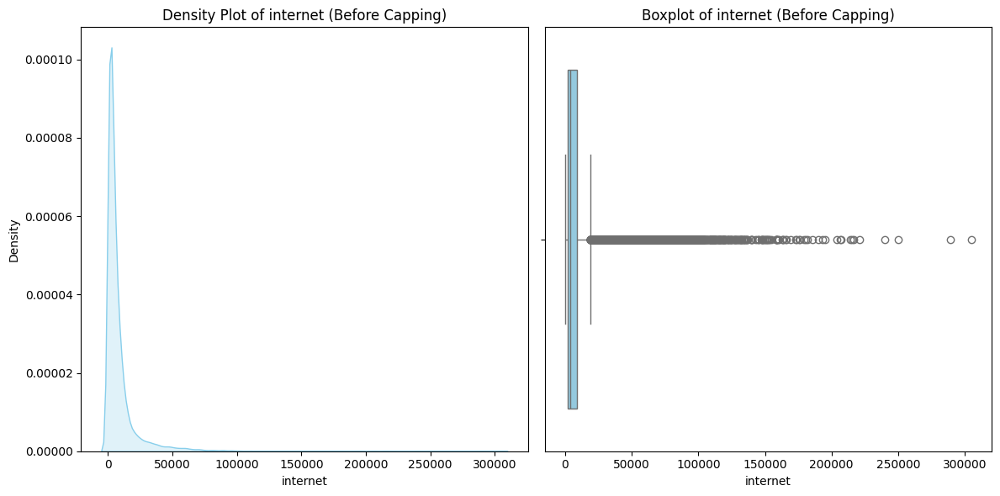


 Στήλη: internet
Q1 = 1747.84, Q3 = 8756.54, IQR = 7008.70
Capping layouts: [-8765.20, 19269.58]


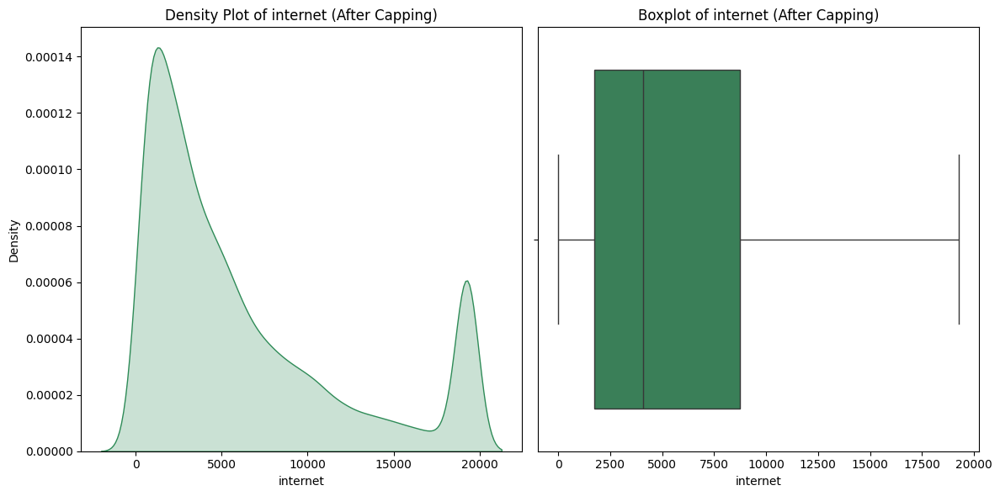


 Statistics AFTER capping:
              smsIn        smsOut        callIn       callOut      internet
count  49990.000000  49990.000000  49990.000000  49990.000000  49990.000000
mean     453.634091    228.995471    330.401437    377.339100   6201.568297
std      436.637081    223.507657    321.048734    369.917048   5836.515110
min        0.000000      0.000000      0.000000      1.523663      0.000000
25%      116.136176     57.772497     82.811105     94.355704   1747.840529
50%      292.603141    143.556206    211.251461    236.761333   4064.368845
75%      634.776175    320.066846    467.601339    535.174152   8756.536171
max     1412.736174    713.508368   1044.786690   1196.401825  19269.579634

DataFrame: totalGridActivity
 Statistics BEFORE capping:
               smsIn        smsOut        callIn       callOut      internet
count    9998.000000   9998.000000   9998.000000   9998.000000  9.998000e+03
mean     3177.701716   1660.357830   2256.044689   2615.860330  4.266747e+04

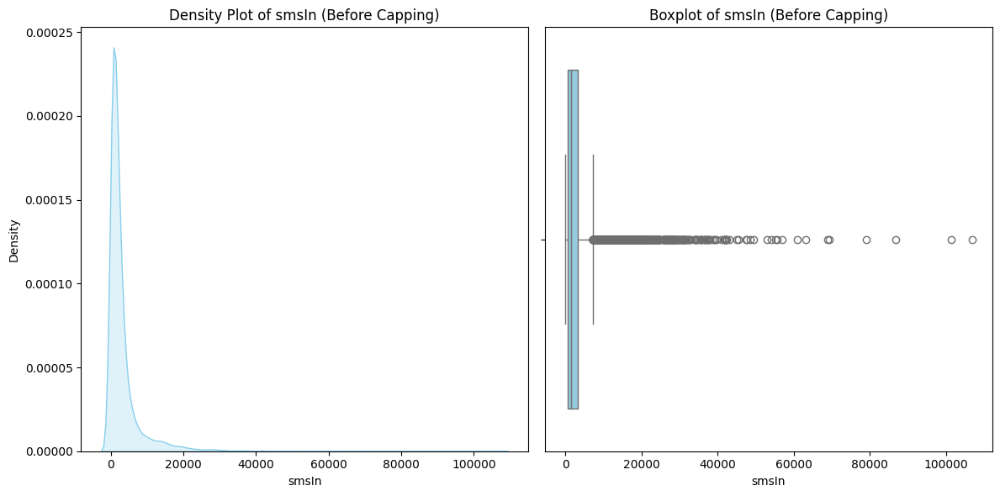


 Στήλη: smsIn
Q1 = 609.42, Q3 = 3220.77, IQR = 2611.35
Capping layouts: [-3307.61, 7137.80]


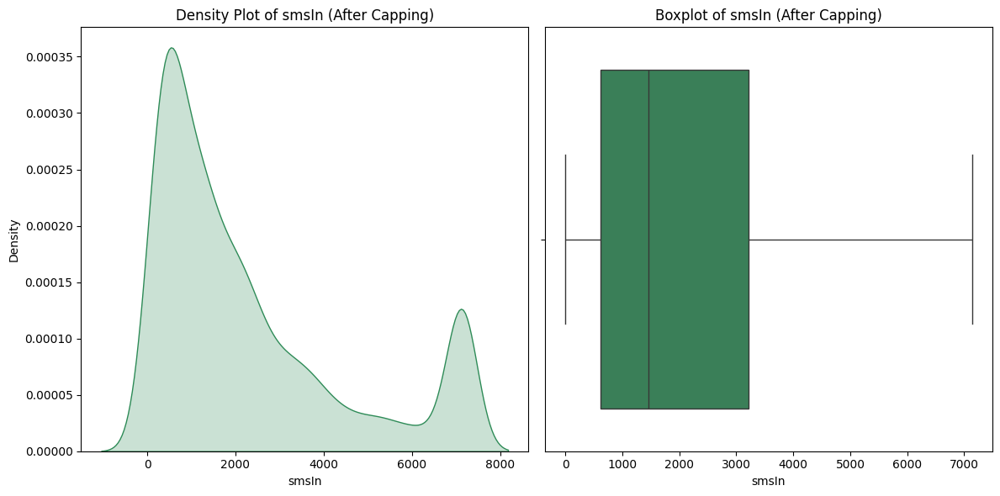

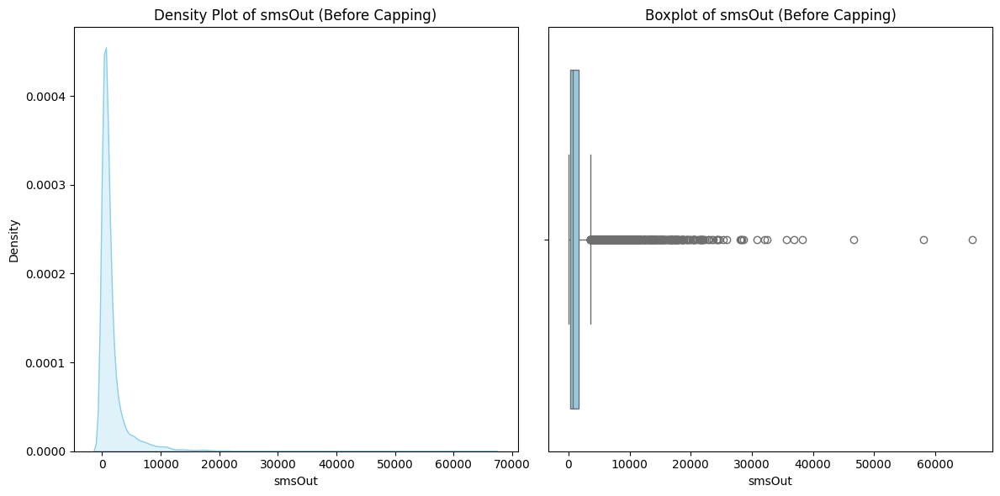


 Στήλη: smsOut
Q1 = 309.65, Q3 = 1620.69, IQR = 1311.04
Capping layouts: [-1656.91, 3587.26]


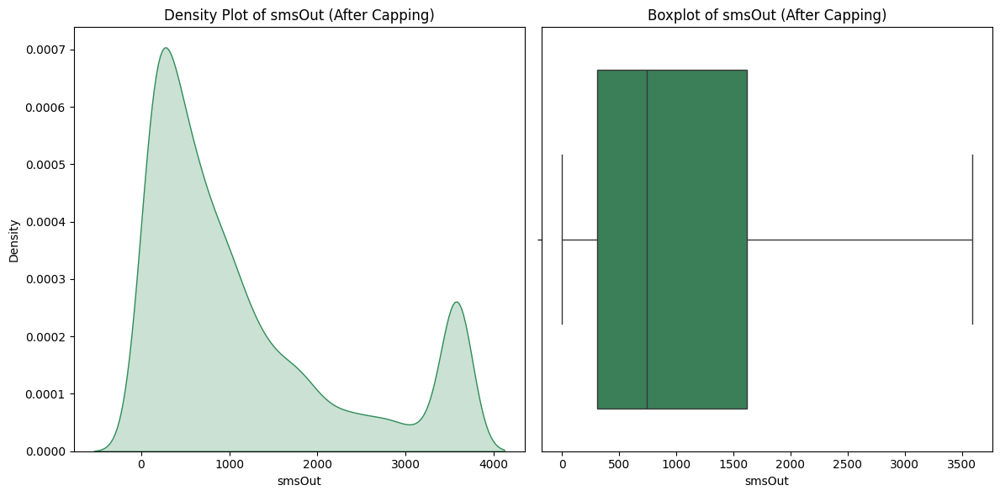

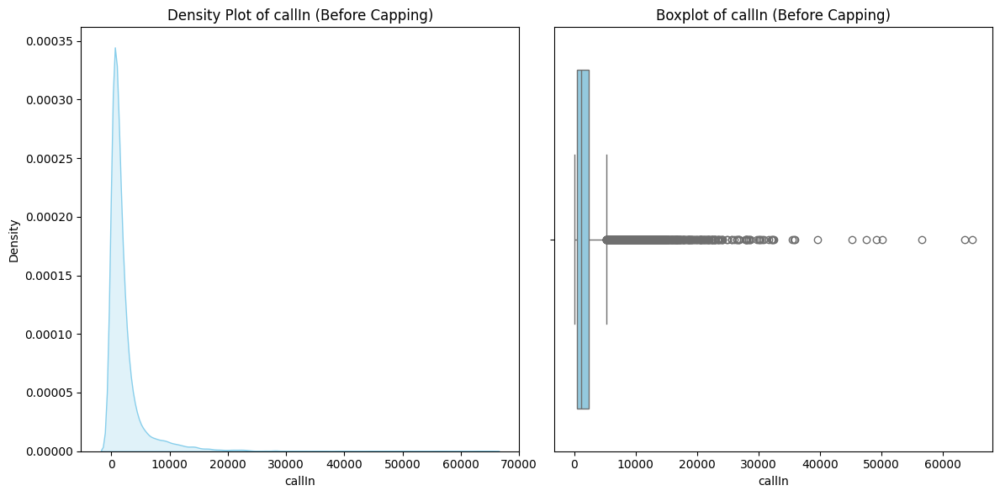


 Στήλη: callIn
Q1 = 445.12, Q3 = 2353.38, IQR = 1908.26
Capping layouts: [-2417.26, 5215.77]


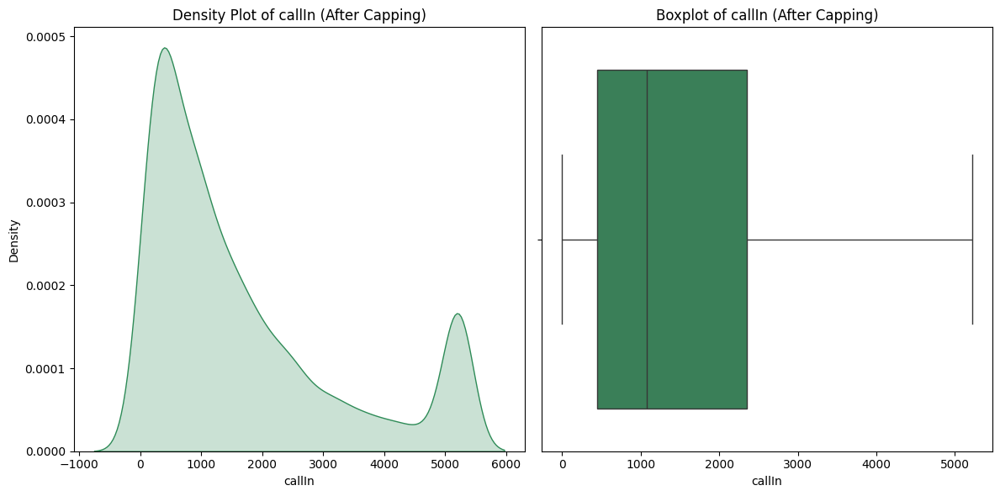

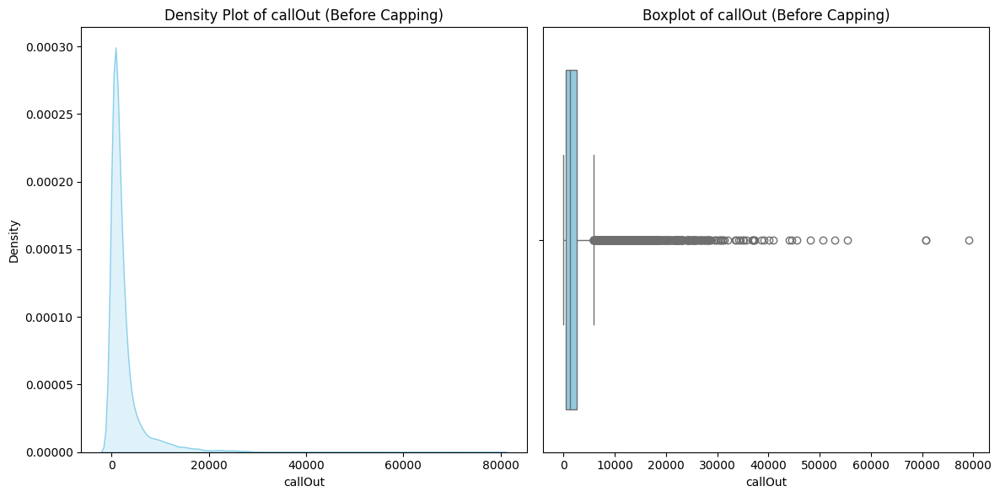


 Στήλη: callOut
Q1 = 500.92, Q3 = 2646.55, IQR = 2145.62
Capping layouts: [-2717.51, 5864.98]


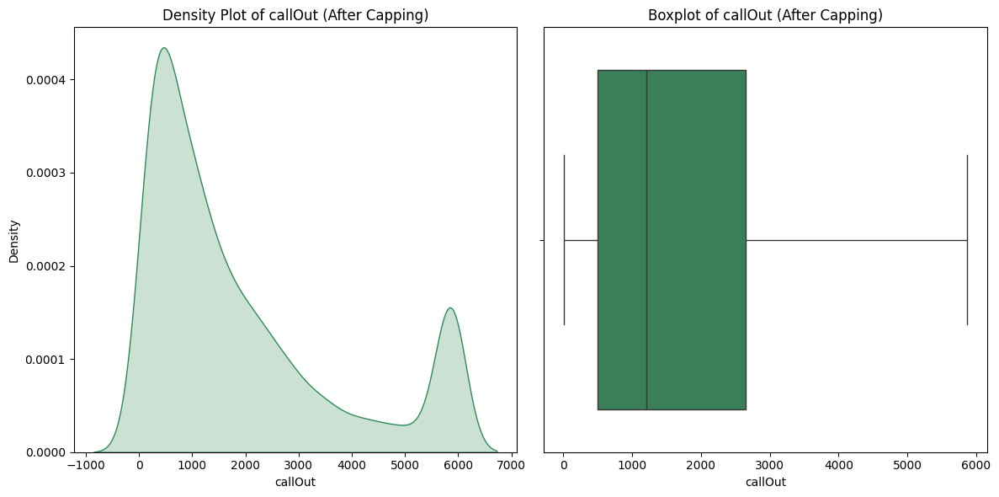

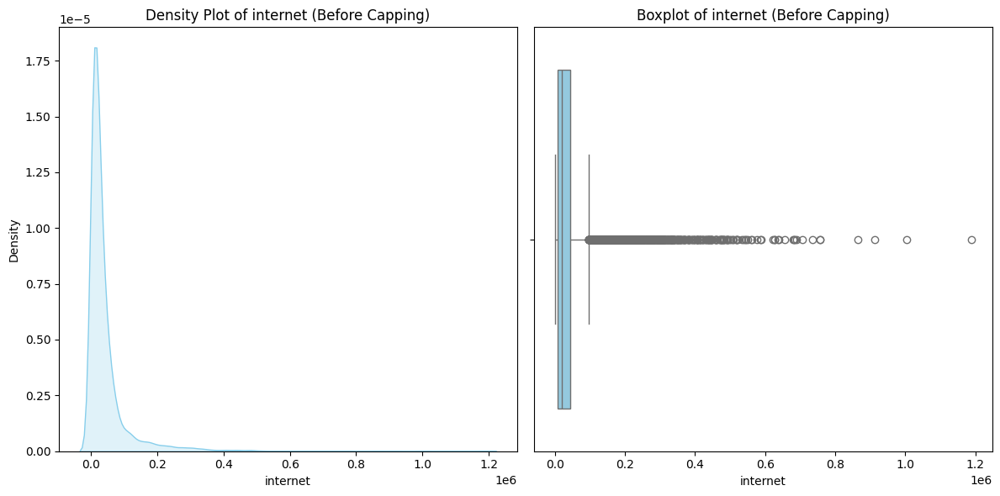


 Στήλη: internet
Q1 = 8989.71, Q3 = 43907.50, IQR = 34917.79
Capping layouts: [-43386.98, 96284.18]


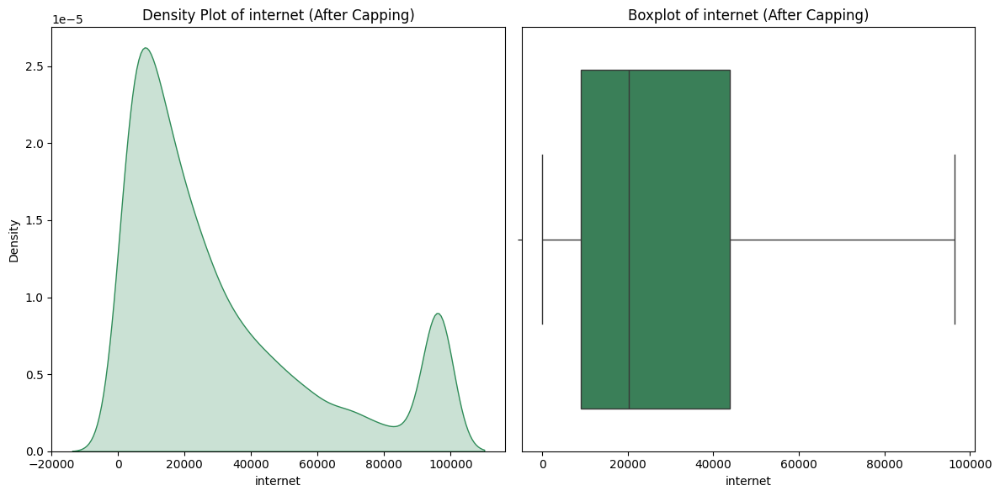


 Statistics AFTER capping:
             smsIn       smsOut       callIn      callOut      internet
count  9998.000000  9998.000000  9998.000000  9998.000000   9998.000000
mean   2298.093450  1160.658834  1676.043663  1900.530030  31098.529667
std    2191.599934  1119.517722  1584.302274  1808.374854  29085.432290
min       0.000000     0.000000     0.000000    10.931116      0.000000
25%     609.418164   309.653011   445.124412   500.922262   8989.707849
50%    1461.037090   742.775535  1078.149462  1209.712862  20280.476203
75%    3220.772847  1620.693938  2353.383252  2646.547001  43907.497956
max    7137.804871  3587.255329  5215.771512  5864.984110  96284.183117


In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

columns_to_cap = ['smsIn', 'smsOut', 'callIn', 'callOut', 'internet']

for i, df in enumerate(dfs):
  print(f"\nDataFrame: {df_names[i]}")
  #statistics before capping
  print(" Statistics BEFORE capping:")
  print(df[columns_to_cap].describe())

  for column in columns_to_cap:
      plt.figure(figsize=(12, 6))

      # Density Plot before capping
      plt.subplot(1, 2, 1)
      sns.kdeplot(df[column].dropna(), fill=True, color="skyblue")
      plt.title(f'Density Plot of {column} (Before Capping)')
      plt.xlabel(column)

      # Boxplot before capping
      plt.subplot(1, 2, 2)
      sns.boxplot(x=df[column], color="skyblue")
      plt.title(f'Boxplot of {column} (Before Capping)')
      plt.xlabel(column)

      plt.tight_layout()
      plt.show()

      #find IQR
      Q1 = np.percentile(df[column].dropna(), 25)
      Q3 = np.percentile(df[column].dropna(), 75)
      IQR = Q3 - Q1
      lower_bound = Q1 - 1.5 * IQR
      upper_bound = Q3 + 1.5 * IQR

      print(f"\n Στήλη: {column}")
      print(f"Q1 = {Q1:.2f}, Q3 = {Q3:.2f}, IQR = {IQR:.2f}")
      print(f"Capping layouts: [{lower_bound:.2f}, {upper_bound:.2f}]")

      # Capping
      df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
      df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])

      # Density Plot andBoxplot after capping
      plt.figure(figsize=(12, 6))

      # Density after
      plt.subplot(1, 2, 1)
      sns.kdeplot(df[column].dropna(), fill=True, color="seagreen")
      plt.title(f'Density Plot of {column} (After Capping)')
      plt.xlabel(column)

      # Boxplot after
      plt.subplot(1, 2, 2)
      sns.boxplot(x=df[column], color="seagreen")
      plt.title(f'Boxplot of {column} (After Capping)')
      plt.xlabel(column)

      plt.tight_layout()
      plt.show()

  #final statistics after capping
  print("\n Statistics AFTER capping:")
  print(df[columns_to_cap].describe())

**FEATURE ENGINNERING**

In [16]:
dailyGridActivity.reset_index(inplace=True)
hourlyGridActivity.reset_index(inplace=True)

hourlyGridActivity['weekdayFlag'] = hourlyGridActivity['startTime'].dt.dayofweek
hourlyGridActivity['hours'] = hourlyGridActivity['startTime'].dt.hour
dailyGridActivity['weekdayFlag'] = dailyGridActivity['startTime'].dt.dayofweek
dailyGridActivity['hours'] = dailyGridActivity['startTime'].dt.hour


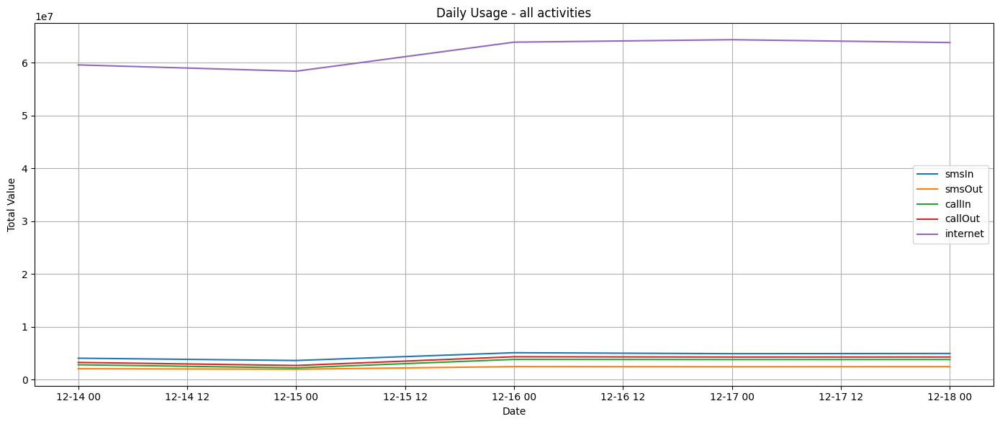

In [17]:
#group daily data based on startTime
daily_features_trend = dailyGridActivity.groupby('startTime')[['smsIn', 'smsOut', 'callIn', 'callOut', 'internet']].sum()

plt.figure(figsize=(14, 6))
for column in daily_features_trend.columns:
    plt.plot(daily_features_trend.index, daily_features_trend[column], label=column)

plt.title('Daily Usage - all activities')
plt.xlabel('Date')
plt.ylabel('Total Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


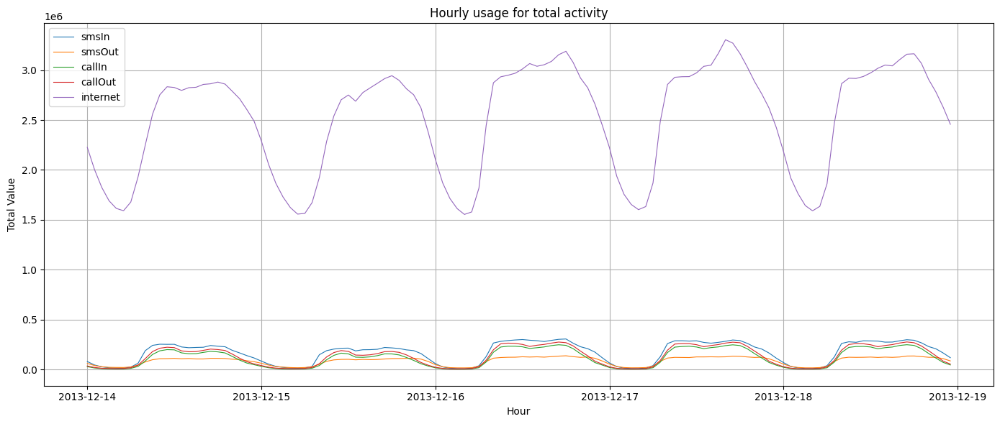

In [18]:
#group hourly data based on startTime
hourly_features_trend = hourlyGridActivity.groupby('startTime')[['smsIn', 'smsOut', 'callIn', 'callOut', 'internet']].sum()

plt.figure(figsize=(14, 6))
for column in hourly_features_trend.columns:
    plt.plot(hourly_features_trend.index, hourly_features_trend[column], label=column, linewidth=0.8)

plt.title('Hourly usage for total activity')
plt.xlabel('Hour')
plt.ylabel('Total Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [19]:
import pandas as pd

numeric_cols = dailyGridActivity.select_dtypes(include=np.number).columns.tolist()

#seperate days
hourlyGridActivity_WE = hourlyGridActivity[hourlyGridActivity['weekdayFlag'].isin([5,6])]
hourlyGridActivity_WD = hourlyGridActivity[~hourlyGridActivity['weekdayFlag'].isin([5,6])]
dailyGridActivity_WE = dailyGridActivity[dailyGridActivity['weekdayFlag'].isin([5,6])]
dailyGridActivity_WD = dailyGridActivity[~dailyGridActivity['weekdayFlag'].isin([5,6])]

# create gridActivity DataFrame
gridActivity = pd.DataFrame()

#Hourly Statistics
for df_in, prefix in [(hourlyGridActivity_WE, "WE"), (hourlyGridActivity_WD, "WD")]:
    df = df_in.reset_index()
    for col in ['sms', 'call', 'internet']:
        grouped = df.groupby(['gridID','hours'])[[col]].mean()
        grouped.reset_index(level=1, drop=True, inplace=True)
        max_ = grouped.groupby('gridID')[[col]].max()
        min_ = grouped.groupby('gridID')[[col]].min()
        avg_ = grouped.groupby('gridID')[[col]].mean()
        max_.columns = [f'hourly{col}Max_{prefix}']
        min_.columns = [f'hourly{col}Min_{prefix}']
        avg_.columns = [f'hourly{col}Avg_{prefix}']
        gridActivity = pd.concat([gridActivity, max_, min_, avg_], axis=1)

#Day & Night activity
for df_in, prefix in [(hourlyGridActivity_WE, "WE"), (hourlyGridActivity_WD, "WD")]:
    # Daytime 08:00–21:59
    mask_day = (df_in.hours >= 8) & (df_in.hours < 22)
    day = df_in[mask_day].groupby('gridID')[['sms','call','internet']].sum()
    day.columns = [f'totalSmsDay_{prefix}', f'totalCallDay_{prefix}', f'totalInternetDay_{prefix}']
    # Night 00:00–07:59
    mask_night = (df_in.hours >= 0) & (df_in.hours < 8)
    night = df_in[mask_night].groupby('gridID')[['sms','call','internet']].sum()
    night.columns = [f'totalSmsNight_{prefix}', f'totalCallNight_{prefix}', f'totalInternetNight_{prefix}']
    gridActivity = pd.concat([gridActivity, day, night], axis=1)

#Ratios
df = dailyGridActivity.groupby('gridID')[numeric_cols].sum()
gridActivity['dailySmsIn/dailySmsOut'] = df['smsIn'] / (df['smsOut'] + 1)
gridActivity['dailyCallIn/dailyCallOut'] = df['callIn'] / (df['callOut'] + 1)
gridActivity['dailySms/dailyCall'] = (df['smsIn'] + df['smsOut']) / (df['callIn'] + df['callOut'] + 1)
gridActivity['dailyInternet/dailySmsCall'] = df['internet'] / (df['smsIn'] + df['smsOut'] + df['callIn'] + df['callOut'] + 1)

#Daily Stats WE/WD
def daily_stats(df, prefix):
    max_ = df.groupby('gridID')[['sms','call','internet']].max()
    min_ = df.groupby('gridID')[['sms','call','internet']].min()
    avg_ = df.groupby('gridID')[['sms','call','internet']].mean()
    max_.columns = [f'smsMax_{prefix}', f'callMax_{prefix}', f'internetMax_{prefix}']
    min_.columns = [f'smsMin_{prefix}', f'callMin_{prefix}', f'internetMin_{prefix}']
    avg_.columns = [f'smsAvg_{prefix}', f'callAvg_{prefix}', f'internetAvg_{prefix}']
    return pd.concat([max_, min_, avg_], axis=1)

gridActivity = pd.concat([
    gridActivity,
    daily_stats(dailyGridActivity_WE, 'WE'),
    daily_stats(dailyGridActivity_WD, 'WD')
], axis=1)

#Weekly Stats
weekly = dailyGridActivity.reset_index()
weeklyAvg = weekly.groupby(['gridID', pd.Grouper(key='startTime', freq='W')])[['sms','call','internet']].mean()
weeklyChange = weeklyAvg.diff().fillna(0).groupby('gridID').mean()
weeklyChange.columns = ['smsAvgdiff_weekly','callAvgdiff_weekly','internetAvgdiff_weekly']
weeklySum = weekly.groupby(['gridID', pd.Grouper(key='startTime', freq='W')])[['sms','call','internet']].sum()
weeklyMax = weeklySum.groupby('gridID').max()
weeklyMin = weeklySum.groupby('gridID').min()
weeklyAvg2 = weeklySum.groupby('gridID').mean()
weeklyMax.columns = ['smsMax_weekly','callMax_weekly','internetMax_weekly']
weeklyMin.columns = ['smsMin_weekly','callMin_weekly','internetMin_weekly']
weeklyAvg2.columns = ['smsAvg_weekly','callAvg_weekly','internetAvg_weekly']
gridActivity = pd.concat([gridActivity, weeklyChange, weeklyMax, weeklyMin, weeklyAvg2], axis=1)

'''### === Monthly Stats === ###
monthly = dailyGridActivity.reset_index()
monthlySum = monthly.groupby(['gridID', pd.Grouper(key='startTime', freq='M')])[['sms','call','internet']].sum()
monthlyAvg = monthlySum.groupby('gridID').mean()
monthlyAvg.columns = ['monthlyAvg_sms','monthlyAvg_call','monthlyAvg_internet']

monthlyMean = monthly.groupby(['gridID', pd.Grouper(key='startTime', freq='M')])[['sms','call','internet']].mean()
nov = monthlyMean.loc[(slice(None), '2013-11-30'), :].reset_index(level=1, drop=True)
nov.columns = ['smsAvg_Nov', 'callAvg_Nov', 'internetAvg_Nov']
dec = monthlyMean.loc[(slice(None), '2013-12-31'), :].reset_index(level=1, drop=True)
dec.columns = ['smsAvg_Dec', 'callAvg_Dec', 'internetAvg_Dec']

monthlyMax = monthly.groupby(['gridID', pd.Grouper(key='startTime', freq='M')])[['sms','call','internet']].max()
max_nov = monthlyMax.loc[(slice(None), '2013-11-30'), :].reset_index(level=1, drop=True)
max_nov.columns = ['smsMax_Nov', 'callMax_Nov', 'internetMax_Nov']
max_dec = monthlyMax.loc[(slice(None), '2013-12-31'), :].reset_index(level=1, drop=True)
max_dec.columns = ['smsMax_Dec', 'callMax_Dec', 'internetMax_Dec']

monthlyMin = monthly.groupby(['gridID', pd.Grouper(key='startTime', freq='M')])[['sms','call','internet']].min()
min_nov = monthlyMin.loc[(slice(None), '2013-11-30'), :].reset_index(level=1, drop=True)
min_nov.columns = ['smsMin_Nov', 'callMin_Nov', 'internetMin_Nov']
min_dec = monthlyMin.loc[(slice(None), '2013-12-31'), :].reset_index(level=1, drop=True)
min_dec.columns = ['smsMin_Dec', 'callMin_Dec', 'internetMin_Dec']

gridActivity = pd.concat([
    gridActivity, monthlyAvg, nov, dec, max_nov, max_dec, min_nov, min_dec
], axis=1)

### === Ειδικές Ημερομηνίες === ###
xmas = dailyGridActivity.loc[(slice(None), '2013-12-25'), ['sms','call','internet']]
xmas.columns = ['totalSms_xMas', 'totalCall_xMas', 'totalInternet_xMas']
xmas = xmas.reset_index(level='startTime', drop=True)
gridActivity = pd.concat([gridActivity, xmas], axis=1)

ny = dailyGridActivity.loc[(slice(None), '2014-01-01'), ['sms','call','internet']]
ny.columns = ['totalSms_NewYear', 'totalCall_NewYear', 'totalInternet_NewYear']
ny = ny.reset_index(level='startTime', drop=True)
gridActivity = pd.concat([gridActivity, ny], axis=1)

nye = hourlyGridActivity.loc[(slice(None), slice('2013-12-31 18:00:00','2014-01-01 01:00:00')), ['sms','call','internet']]
nye = nye.groupby('gridID').sum()
nye.columns = ['totalSms_NewYearEve', 'totalCall_NewYearEve', 'totalInternet_NewYearEve']
gridActivity = pd.concat([gridActivity, nye], axis=1)'''

#TotalGridActivity aggregates
total = totalGridActivity
gridActivity[['totalSmsIn','totalSmsOut','totalSMS','totalCallIn','totalCallOut','totalCall','totalInternet']] = \
    total[['smsIn','smsOut','sms','callIn','callOut','call','internet']]


In [20]:
gridActivity

,hourlysmsMax_WE,hourlysmsMin_WE,hourlysmsAvg_WE,hourlycallMax_WE,hourlycallMin_WE,hourlycallAvg_WE,hourlyinternetMax_WE,hourlyinternetMin_WE,hourlyinternetAvg_WE,hourlysmsMax_WD,...,smsAvg_weekly,callAvg_weekly,internetAvg_weekly,totalSmsIn,totalSmsOut,totalSMS,totalCallIn,totalCallOut,totalCall,totalInternet
gridID,,,,,,,,,,,,,,,,,,,,,
1,12.728697,0.352665,6.401662,10.543018,0.135382,4.571657,85.906310,31.342991,65.286397,11.358814,...,372.563344,331.823924,3657.191413,478.800559,266.326129,745.126688,327.149660,336.498189,663.647848,7314.382827
2,13.039338,0.357027,6.508872,10.708220,0.137563,4.643906,86.329152,31.474431,65.549620,11.477396,...,377.870572,336.990117,3673.390033,485.510072,270.231072,755.741144,332.073895,341.906339,673.980234,7346.780065
3,13.370003,0.361669,6.622994,10.884071,0.139884,4.720812,86.779251,31.614344,65.829810,11.603622,...,383.519906,342.489325,3690.632822,492.652083,274.387730,767.039813,337.315549,347.663102,684.978651,7381.265644
4,11.828919,0.340033,6.091124,10.064506,0.129066,4.362388,84.681540,30.962271,64.523968,11.015338,...,357.190863,316.859953,3610.271820,459.366334,255.015392,714.381725,312.886523,320.833383,633.719906,7220.543641
5,11.114360,0.310722,5.679938,9.407933,0.118375,4.062073,76.929878,28.288955,58.541220,10.206037,...,333.058788,295.922090,3277.262282,428.293517,237.824058,666.117576,291.647503,300.196676,591.844179,6554.524564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,37.229737,1.062532,18.035403,35.652338,0.290877,15.333887,286.166414,118.974078,213.953726,44.255725,...,1245.285209,1282.730346,12663.624114,1726.470452,764.099966,2490.570418,1181.413406,1384.047285,2565.460691,25327.248228
9997,39.170280,0.974099,19.805932,38.185094,0.250564,16.630885,322.445830,154.978018,248.118656,46.340465,...,1365.691496,1377.127977,14405.884012,1887.447296,843.935697,2731.382992,1258.532106,1495.723848,2754.255953,28811.768025
9998,38.870130,0.987817,19.473822,37.699443,0.257423,16.372336,315.914539,147.968036,241.706547,45.941833,...,1342.010307,1357.144587,14074.460105,1855.476879,828.543734,2684.020613,1242.052815,1472.236360,2714.289174,28148.920211


**MERGE TEMPORAL FEATURES WITH SPATIAL FEATURES**

In [21]:
import folium
import geopandas as gpd
import json

file_path = "/content/drive/MyDrive/milano-grid.geojson"

#load geojson file
with open(file_path, "r", encoding="utf-8") as f:
    geojson_data = json.load(f)

#find geojson schema
geojson_schema = {
    "type": geojson_data.get("type", "Unknown"),
    "features_type": type(geojson_data.get("features", [])),
    "num_features": len(geojson_data.get("features", [])),
    "sample_feature": geojson_data["features"][0] if geojson_data.get("features") else None
}

#shoe geojson schema
geojson_schema

#reaf geojson file
milan = gpd.read_file('/content/drive/MyDrive/milano-grid.geojson')

#find center for zoom
center = milan.geometry.unary_union.centroid.coords[:][0][::-1]  # (lat, lon)

#create map
m = folium.Map(location=center, zoom_start=12)

#add geojson to map
folium.GeoJson(milan).add_to(m)

#show map
m

<ipython-input-21-83dc6f84f4d6>:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center = milan.geometry.unary_union.centroid.coords[:][0][::-1]  # (lat, lon)


In [22]:
import pandas as pd
import json
import numpy as np
from shapely.geometry import Polygon, Point

#load geojson file
geojson_path = "/content/drive/MyDrive/milano-grid.geojson"
with open(geojson_path, 'r', encoding='utf-8') as f:
    geojson_data = json.load(f)

#extract spatial features
grid_data = []
milan_center = Point(9.19, 45.46)  #Milan historical center(apprx.)

for feature in geojson_data["features"]:
    grid_id = feature["properties"]["cellId"]
    geometry_type = feature["geometry"]["type"]
    coordinates = feature["geometry"]["coordinates"][0]

    #Centroid
    longitudes = [pt[0] for pt in coordinates]
    latitudes = [pt[1] for pt in coordinates]
    center_lon = sum(longitudes) / len(longitudes)
    center_lat = sum(latitudes) / len(latitudes)

    #Polygon object
    polygon = Polygon(coordinates)

    #Feature engineering
    area = polygon.area
    perimeter = polygon.length
    compactness = 4 * np.pi * area / (perimeter ** 2) if perimeter != 0 else 0
    n_vertices = len(coordinates)
    distance_from_center = polygon.centroid.distance(milan_center)

    grid_data.append({
        'gridID': grid_id,
        'geometry_type': geometry_type,
        'longitude': center_lon,
        'latitude': center_lat,
        'coordinates': coordinates,
        'area': area,
        'perimeter': perimeter,
        'compactness': compactness,
        'n_vertices': n_vertices,
        'distance_from_center': distance_from_center
    })

geo_df = pd.DataFrame(grid_data)

#merge with gridActivity
merged_df = gridActivity.merge(geo_df, on="gridID", how="left")

In [23]:
merged_df

,gridID,hourlysmsMax_WE,hourlysmsMin_WE,hourlysmsAvg_WE,hourlycallMax_WE,hourlycallMin_WE,hourlycallAvg_WE,hourlyinternetMax_WE,hourlyinternetMin_WE,hourlyinternetAvg_WE,...,totalInternet,geometry_type,longitude,latitude,coordinates,area,perimeter,compactness,n_vertices,distance_from_center
0,1,12.728697,0.352665,6.401662,10.543018,0.135382,4.571657,85.906310,31.342991,65.286397,...,7314.382827,Polygon,9.012691,45.357955,"[[9.0114910478323, 45.35880131440966], [9.0144...",0.000006,0.010231,0.761889,5,0.204423
1,2,13.039338,0.357027,6.508872,10.708220,0.137563,4.643906,86.329152,31.474431,65.549620,...,7346.780065,Polygon,9.015691,45.357955,"[[9.014491488013135, 45.35880097314403], [9.01...",0.000006,0.010231,0.761889,5,0.201830
2,3,13.370003,0.361669,6.622994,10.884071,0.139884,4.720812,86.779251,31.614344,65.829810,...,7381.265644,Polygon,9.018692,45.357954,"[[9.017491928134044, 45.358800553060284], [9.0...",0.000006,0.010231,0.761889,5,0.199250
3,4,11.828919,0.340033,6.091124,10.064506,0.129066,4.362388,84.681540,30.962271,64.523968,...,7220.543641,Polygon,9.021692,45.357954,"[[9.02049236818262, 45.35880005415845], [9.023...",0.000006,0.010231,0.761889,5,0.196681
4,5,11.114360,0.310722,5.679938,9.407933,0.118375,4.062073,76.929878,28.288955,58.541220,...,6554.524564,Polygon,9.024693,45.357953,"[[9.023492808146456, 45.35879947643852], [9.02...",0.000006,0.010231,0.761889,5,0.194124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,9996,37.229737,1.062532,18.035403,35.652338,0.290877,15.333887,286.166414,118.974078,213.953726,...,25327.248228,Polygon,9.298831,45.566978,"[[9.297630740052327, 45.56782693472525], [9.30...",0.000006,0.010253,0.761394,5,0.152671
9994,9997,39.170280,0.974099,19.805932,38.185094,0.250564,16.630885,322.445830,154.978018,248.118656,...,28811.768025,Polygon,9.301842,45.566970,"[[9.300642247414926, 45.56781904882199], [9.30...",0.000006,0.010253,0.761394,5,0.154832
9995,9998,38.870130,0.987817,19.473822,37.699443,0.257423,16.372336,315.914539,147.968036,241.706547,...,28148.920211,Polygon,9.304854,45.566962,"[[9.303653753522097, 45.567811083530515], [9.3...",0.000006,0.010253,0.761394,5,0.157022
9996,9999,26.768135,1.146059,13.093242,27.462770,0.143521,11.716189,193.021014,67.034426,139.993682,...,16872.899113,Polygon,9.307865,45.566954,"[[9.30666525836126, 45.567803038850904], [9.30...",0.000006,0.010253,0.761394,5,0.159238


**Area of historical center**

In [24]:
import folium
import geopandas as gpd
import json
from shapely.geometry import Point

# Load geojson file
file_path = "/content/drive/MyDrive/milano-grid.geojson"
milan = gpd.read_file(file_path)

# Define Milan center (approximate)
milan_center = Point(9.19, 45.46)

# Calculate center of grid for map centering
center = milan.geometry.unary_union.centroid.coords[:][0][::-1]  # [lat, lon]

# Create the map
m = folium.Map(location=center, zoom_start=12)

# Add the geojson grid
folium.GeoJson(milan).add_to(m)

# Display the map
m


<ipython-input-24-108845aade99>:14: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center = milan.geometry.unary_union.centroid.coords[:][0][::-1]  # [lat, lon]


# **STATISTICAL ANALYSIS**

**TEMPORAL FEATURES**

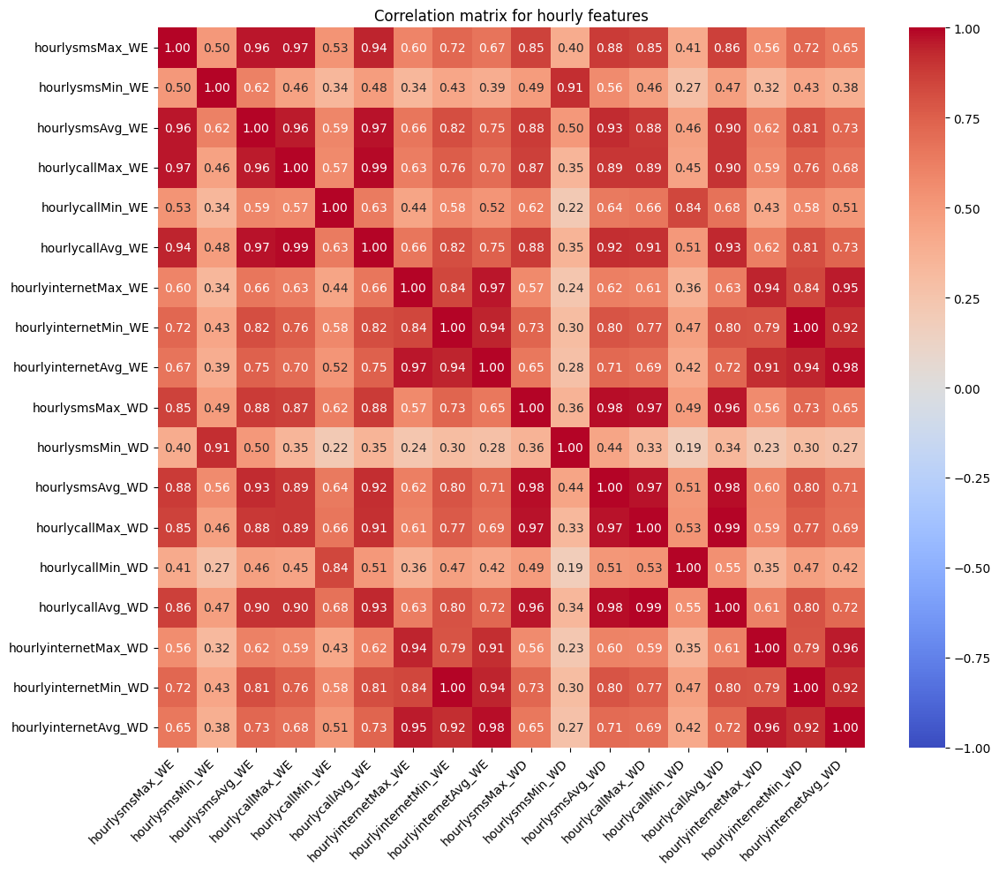

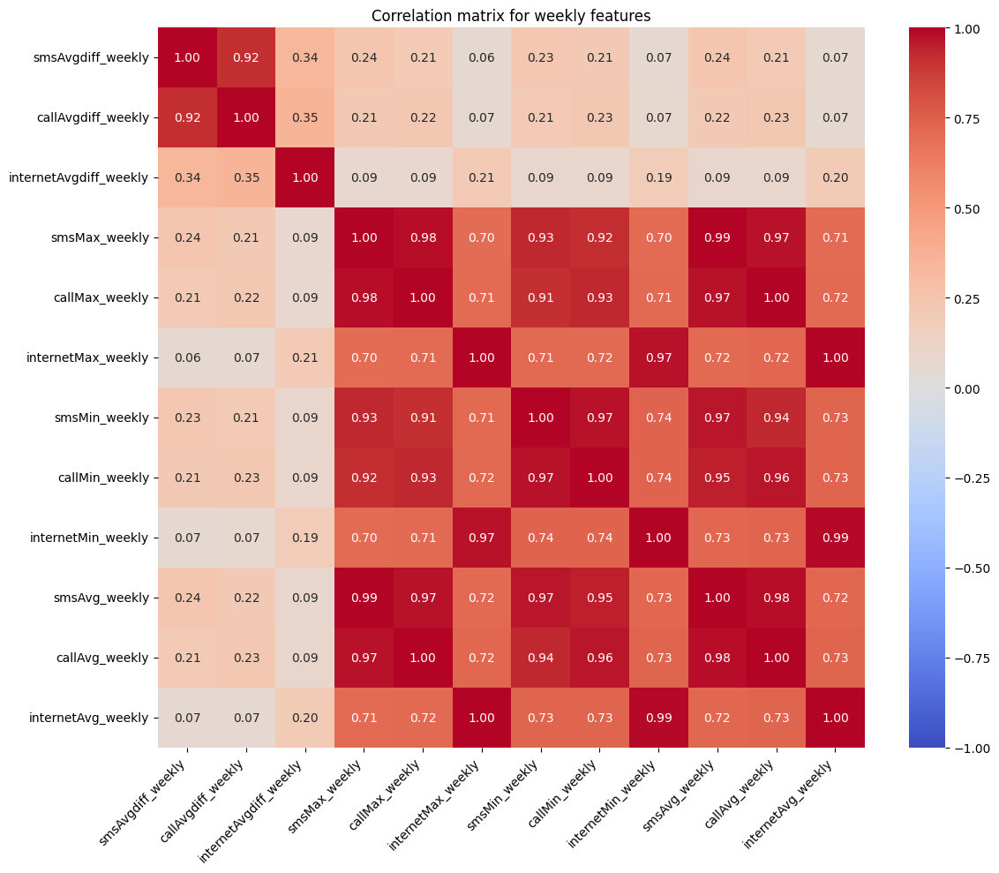

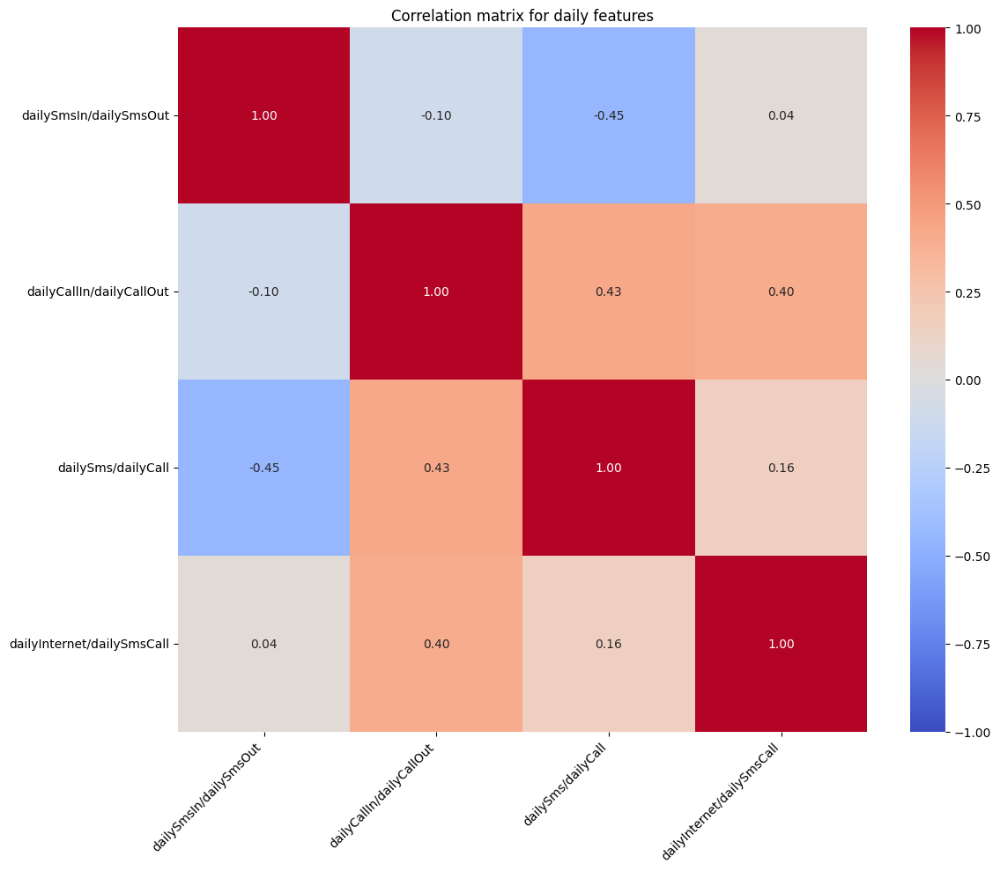

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_feature_correlation(prefix, df=gridActivity):
    selected = df[[col for col in df.columns if prefix in col]]
    corr = selected.corr()

    plt.figure(figsize=(12,10))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f"Correlation matrix for {prefix} features")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

plot_feature_correlation('hourly')
plot_feature_correlation('weekly')
plot_feature_correlation('daily')


In [26]:
#selected time features based on heatmaps
selected_columns = [
    # Hourly (Avg only)
    'hourlysmsAvg_WE', 'hourlycallAvg_WE', 'hourlyinternetAvg_WE',
    'hourlysmsAvg_WD', 'hourlycallAvg_WD', 'hourlyinternetAvg_WD',

    # Weekly (Avg + Avgdiff)
    'smsAvgdiff_weekly', 'callAvgdiff_weekly', 'internetAvgdiff_weekly',
    'smsAvg_weekly', 'callAvg_weekly', 'internetAvg_weekly',

    # Daily ratios
    'dailySmsIn/dailySmsOut', 'dailyCallIn/dailyCallOut',
    'dailySms/dailyCall', 'dailyInternet/dailySmsCall'
]

#df with selected features
gridActivity_selected = gridActivity[selected_columns].copy()

In [27]:
gridActivity_selected

,hourlysmsAvg_WE,hourlycallAvg_WE,hourlyinternetAvg_WE,hourlysmsAvg_WD,hourlycallAvg_WD,hourlyinternetAvg_WD,smsAvgdiff_weekly,callAvgdiff_weekly,internetAvgdiff_weekly,smsAvg_weekly,callAvg_weekly,internetAvg_weekly,dailySmsIn/dailySmsOut,dailyCallIn/dailyCallOut,dailySms/dailyCall,dailyInternet/dailySmsCall
gridID,,,,,,,,,,,,,,,,
1,6.401662,4.571657,65.286397,6.081207,6.169560,58.064385,-3.845450,19.174828,-86.664144,372.563344,331.823924,3657.191413,1.791073,0.969338,1.121085,5.188335
2,6.508872,4.643906,65.549620,6.157157,6.264899,58.338865,0.911390,1.144076,3.293758,377.870572,336.990117,3673.390033,1.790024,0.968410,1.119649,5.135018
3,6.622994,4.720812,65.829810,6.238002,6.366385,58.631038,0.970139,1.217824,3.506075,383.519906,342.489325,3690.632822,1.788940,0.967454,1.118169,5.079953
4,6.091124,4.362388,64.523968,5.861219,5.893407,57.269350,-4.521389,-5.675738,-16.340261,357.190863,316.859953,3610.271820,1.794292,0.972200,1.125507,5.352112
5,5.679938,4.062073,58.541220,5.465008,5.512009,52.007583,-4.754537,-4.576770,-63.141195,333.058788,295.922090,3277.262282,1.793343,0.968296,1.123596,5.206294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,18.035403,15.333887,213.953726,22.567654,25.408807,209.131519,24.895535,18.852486,418.429092,1245.285209,1282.730346,12663.624114,2.256529,0.852977,0.970430,5.008324
9997,19.805932,16.630885,248.118656,24.731920,27.166298,234.751008,25.971200,21.089892,307.433859,1365.691496,1377.127977,14405.884012,2.233835,0.840858,0.991335,5.251260
9998,19.473822,16.372336,241.706547,24.295516,26.783570,229.819527,-5.236848,-4.592741,-59.177762,1342.010307,1357.144587,14074.460105,2.236744,0.843078,0.988484,5.213429


Top 10 features influencing 1ο Principal Component:
smsAvg_weekly       0.134370
totalSMS            0.134370
totalCall           0.134220
callAvg_weekly      0.134220
callMax_WE          0.133061
smsMin_WE           0.132925
smsMin_weekly       0.132897
callMin_weekly      0.132892
callAvg_WE          0.132889
hourlycallAvg_WE    0.132888
Name: PC1, dtype: float64

Top 10 features - total contribution:
internetAvgdiff_weekly        0.839055
dailySmsIn/dailySmsOut        0.561309
callAvgdiff_weekly            0.553569
dailyInternet/dailySmsCall    0.546782
smsAvgdiff_weekly             0.523448
hourlycallMin_WD              0.518622
hourlysmsMin_WD               0.449830
hourlycallMin_WE              0.439340
dailyCallIn/dailyCallOut      0.436443
hourlysmsMin_WE               0.418708
dtype: float64


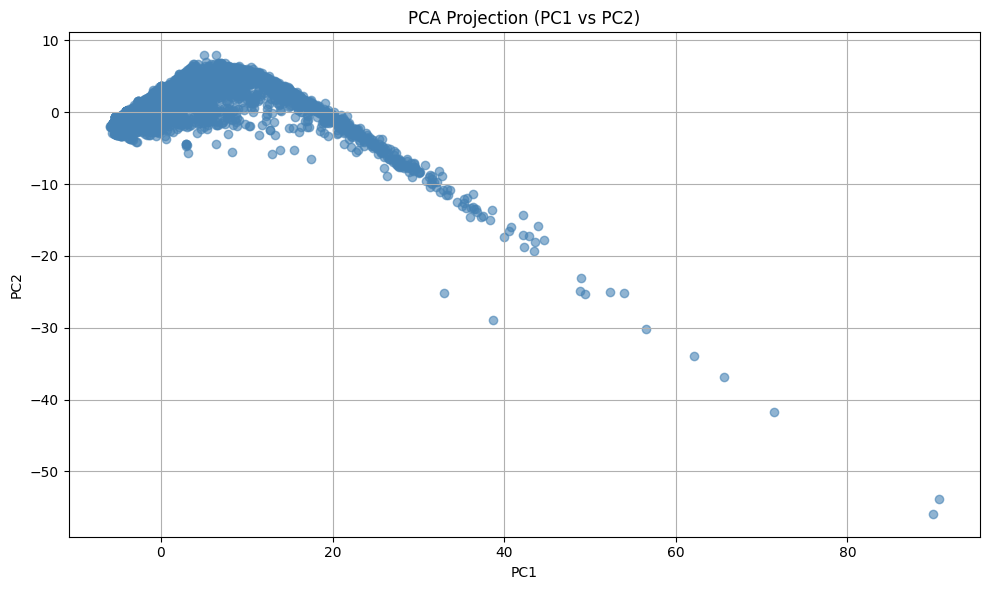

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#normalization
scaler = StandardScaler()
scaled = scaler.fit_transform(gridActivity)

#PCA keep 95% of variation
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(scaled)

#compute Loading
loadings = pca.components_.T  # shape: (n_features, n_components)
pca_features = pd.DataFrame(
    loadings,
    index=gridActivity.columns,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)]
)

#top features for first Principal Component
contrib_pc1 = pca_features['PC1'].abs().sort_values(ascending=False)
print("Top 10 features influencing 1ο Principal Component:")
print(contrib_pc1.head(10))

#overall PCA contribution
overall_contrib = pca_features.abs().max(axis=1).sort_values(ascending=False)
print("\nTop 10 features - total contribution:")
print(overall_contrib.head(10))

#PC1-PC2
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c='steelblue', alpha=0.6)
plt.title('PCA Projection (PC1 vs PC2)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.tight_layout()
plt.show()

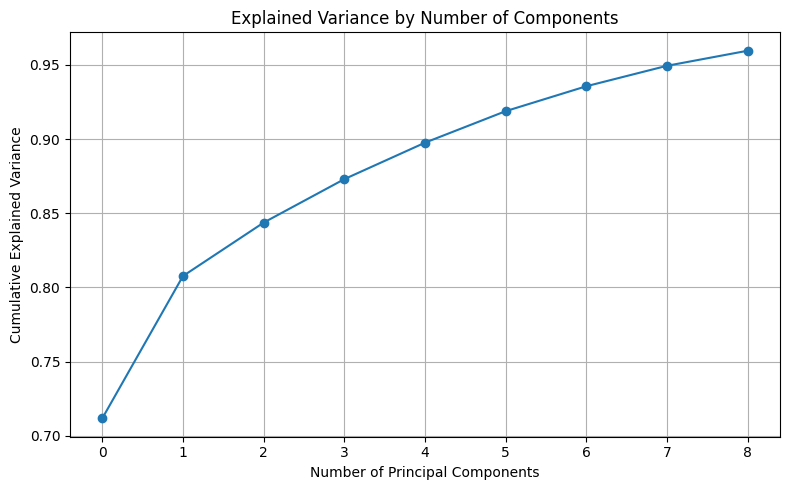

In [29]:
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid(True)
plt.tight_layout()
plt.show()


In [30]:
final_features = list(set(selected_columns) | {
    'hourlycallMin_WD', 'hourlycallMin_WE', 'hourlysmsMin_WD', 'hourlysmsMin_WE'
})

#final DataFrame with all selected time features
selected_features_df = merged_df[final_features]

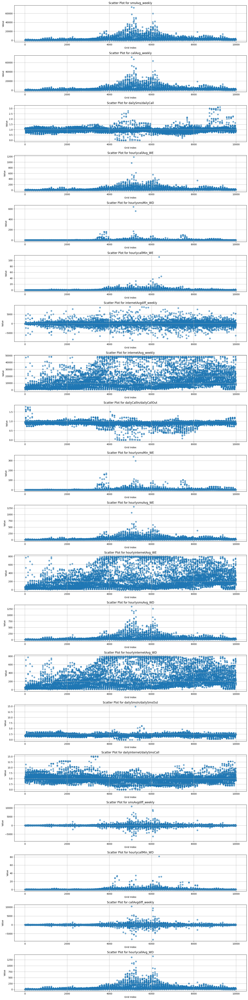

In [31]:
import matplotlib.pyplot as plt

features = final_features
num_features = len(features)

plt.figure(figsize=(15, num_features * 3))

for i, col in enumerate(features, 1):
    plt.subplot(num_features, 1, i)
    plt.scatter(range(len(merged_df)), merged_df[col], alpha=0.6)
    plt.title(f"Scatter Plot for {col}")
    plt.xlabel("Grid Index")
    plt.ylabel("Value")
    plt.grid(True)

plt.tight_layout()
plt.show()

In [32]:
selected_features_df

,smsAvg_weekly,callAvg_weekly,dailySms/dailyCall,hourlycallAvg_WE,hourlysmsMin_WD,hourlycallMin_WE,internetAvgdiff_weekly,internetAvg_weekly,dailyCallIn/dailyCallOut,hourlysmsMin_WE,hourlysmsAvg_WE,hourlyinternetAvg_WE,hourlysmsAvg_WD,hourlyinternetAvg_WD,dailySmsIn/dailySmsOut,dailyInternet/dailySmsCall,smsAvgdiff_weekly,hourlycallMin_WD,callAvgdiff_weekly,hourlycallAvg_WD
0,372.563344,331.823924,1.121085,4.571657,0.225279,0.135382,-86.664144,3657.191413,0.969338,0.352665,6.401662,65.286397,6.081207,58.064385,1.791073,5.188335,-3.845450,0.029504,19.174828,6.169560
1,377.870572,336.990117,1.119649,4.643906,0.224788,0.137563,3.293758,3673.390033,0.968410,0.357027,6.508872,65.549620,6.157157,58.338865,1.790024,5.135018,0.911390,0.028873,1.144076,6.264899
2,383.519906,342.489325,1.118169,4.720812,0.224265,0.139884,3.506075,3690.632822,0.967454,0.361669,6.622994,65.829810,6.238002,58.631038,1.788940,5.079953,0.970139,0.028202,1.217824,6.366385
3,357.190863,316.859953,1.125507,4.362388,0.226702,0.129066,-16.340261,3610.271820,0.972200,0.340033,6.091124,64.523968,5.861219,57.269350,1.794292,5.352112,-4.521389,0.031330,-5.675738,5.893407
4,333.058788,295.922090,1.123596,4.062073,0.216696,0.118375,-63.141195,3277.262282,0.968296,0.310722,5.679938,58.541220,5.465008,52.007583,1.793343,5.206294,-4.754537,0.030571,-4.576770,5.512009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,1245.285209,1282.730346,0.970430,15.333887,0.455503,0.290877,418.429092,12663.624114,0.852977,1.062532,18.035403,213.953726,22.567654,209.131519,2.256529,5.008324,24.895535,0.291680,18.852486,25.408807
9994,1365.691496,1377.127977,0.991335,16.630885,0.465494,0.250564,307.433859,14405.884012,0.840858,0.974099,19.805932,248.118656,24.731920,234.751008,2.233835,5.251260,25.971200,0.253991,21.089892,27.166298
9995,1342.010307,1357.144587,0.988484,16.372336,0.461001,0.257423,-59.177762,14074.460105,0.843078,0.987817,19.473822,241.706547,24.295516,229.819527,2.236744,5.213429,-5.236848,0.258604,-4.592741,26.783570
9996,907.046717,991.087723,0.914742,11.716189,0.297839,0.143521,-1065.633934,8436.449556,0.881830,1.146059,13.093242,139.993682,16.466914,141.016700,2.316075,4.443430,-93.943223,0.156477,-84.769777,19.719422


**SPATIAL FEATURES**

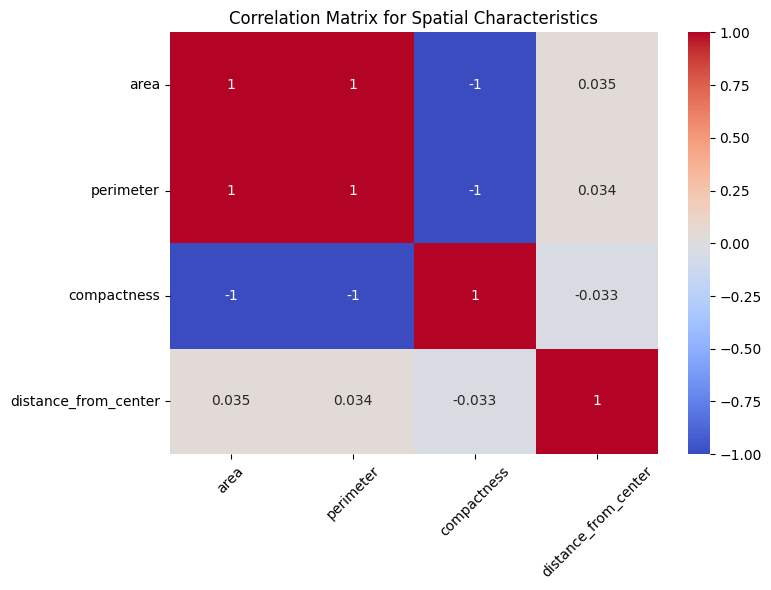

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

#select only numeric spatial features
spatial_features = ['area', 'perimeter', 'compactness', 'distance_from_center']
corr_matrix = merged_df[spatial_features].corr()

#create Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix for Spatial Characteristics")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


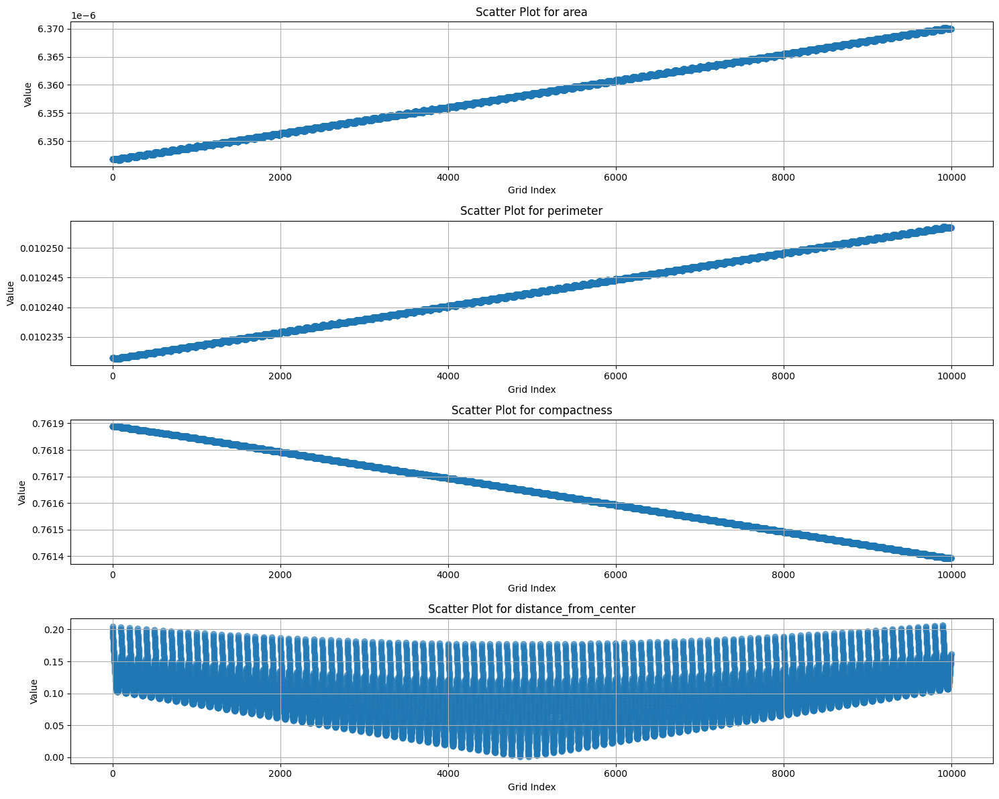

In [34]:
import matplotlib.pyplot as plt

features = spatial_features
num_features = len(features)

plt.figure(figsize=(15, num_features * 3))

for i, col in enumerate(features, 1):
    plt.subplot(num_features, 1, i)
    plt.scatter(range(len(merged_df)), merged_df[col], alpha=0.6)
    plt.title(f"Scatter Plot for {col}")
    plt.xlabel("Grid Index")
    plt.ylabel("Value")
    plt.grid(True)

plt.tight_layout()
plt.show()

In [35]:
selected_spatial_features = ['area', 'compactness', 'distance_from_center']

#merge all selected features
final_features = list(
    set(selected_columns)
    | {'hourlycallMin_WD', 'hourlycallMin_WE', 'hourlysmsMin_WD', 'hourlysmsMin_WE'}
    | set(selected_spatial_features)
)

#create final DataFrame for clustering
selected_features_df = merged_df[final_features]


In [36]:
selected_features_df

,smsAvg_weekly,callAvg_weekly,dailySms/dailyCall,hourlycallAvg_WE,hourlysmsMin_WD,hourlycallMin_WE,internetAvgdiff_weekly,internetAvg_weekly,dailyCallIn/dailyCallOut,hourlysmsMin_WE,...,hourlyinternetAvg_WD,dailySmsIn/dailySmsOut,area,compactness,dailyInternet/dailySmsCall,smsAvgdiff_weekly,hourlycallMin_WD,callAvgdiff_weekly,hourlycallAvg_WD,distance_from_center
0,372.563344,331.823924,1.121085,4.571657,0.225279,0.135382,-86.664144,3657.191413,0.969338,0.352665,...,58.064385,1.791073,0.000006,0.761889,5.188335,-3.845450,0.029504,19.174828,6.169560,0.204423
1,377.870572,336.990117,1.119649,4.643906,0.224788,0.137563,3.293758,3673.390033,0.968410,0.357027,...,58.338865,1.790024,0.000006,0.761889,5.135018,0.911390,0.028873,1.144076,6.264899,0.201830
2,383.519906,342.489325,1.118169,4.720812,0.224265,0.139884,3.506075,3690.632822,0.967454,0.361669,...,58.631038,1.788940,0.000006,0.761889,5.079953,0.970139,0.028202,1.217824,6.366385,0.199250
3,357.190863,316.859953,1.125507,4.362388,0.226702,0.129066,-16.340261,3610.271820,0.972200,0.340033,...,57.269350,1.794292,0.000006,0.761889,5.352112,-4.521389,0.031330,-5.675738,5.893407,0.196681
4,333.058788,295.922090,1.123596,4.062073,0.216696,0.118375,-63.141195,3277.262282,0.968296,0.310722,...,52.007583,1.793343,0.000006,0.761889,5.206294,-4.754537,0.030571,-4.576770,5.512009,0.194124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,1245.285209,1282.730346,0.970430,15.333887,0.455503,0.290877,418.429092,12663.624114,0.852977,1.062532,...,209.131519,2.256529,0.000006,0.761394,5.008324,24.895535,0.291680,18.852486,25.408807,0.152671
9994,1365.691496,1377.127977,0.991335,16.630885,0.465494,0.250564,307.433859,14405.884012,0.840858,0.974099,...,234.751008,2.233835,0.000006,0.761394,5.251260,25.971200,0.253991,21.089892,27.166298,0.154832
9995,1342.010307,1357.144587,0.988484,16.372336,0.461001,0.257423,-59.177762,14074.460105,0.843078,0.987817,...,229.819527,2.236744,0.000006,0.761394,5.213429,-5.236848,0.258604,-4.592741,26.783570,0.157022
9996,907.046717,991.087723,0.914742,11.716189,0.297839,0.143521,-1065.633934,8436.449556,0.881830,1.146059,...,141.016700,2.316075,0.000006,0.761394,4.443430,-93.943223,0.156477,-84.769777,19.719422,0.159238


# **CLUSTERING**

**k-MEANS**

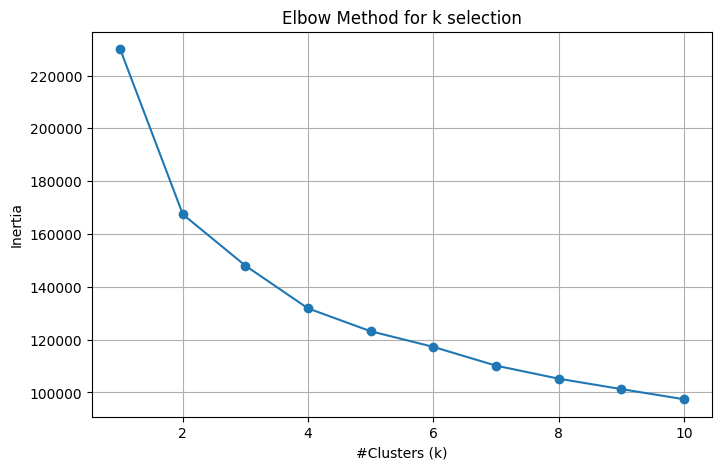

In [37]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

#normalization
scaler = StandardScaler()
scaled_features = scaler.fit_transform(selected_features_df)

#find inertia for k values
inertias = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertias.append(kmeans.inertia_)

#Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertias, marker='o')
plt.xlabel("#Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for k selection")
plt.grid(True)
plt.show()

<ipython-input-38-f9f5c34809f3>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_features_df['cluster'] = clusters


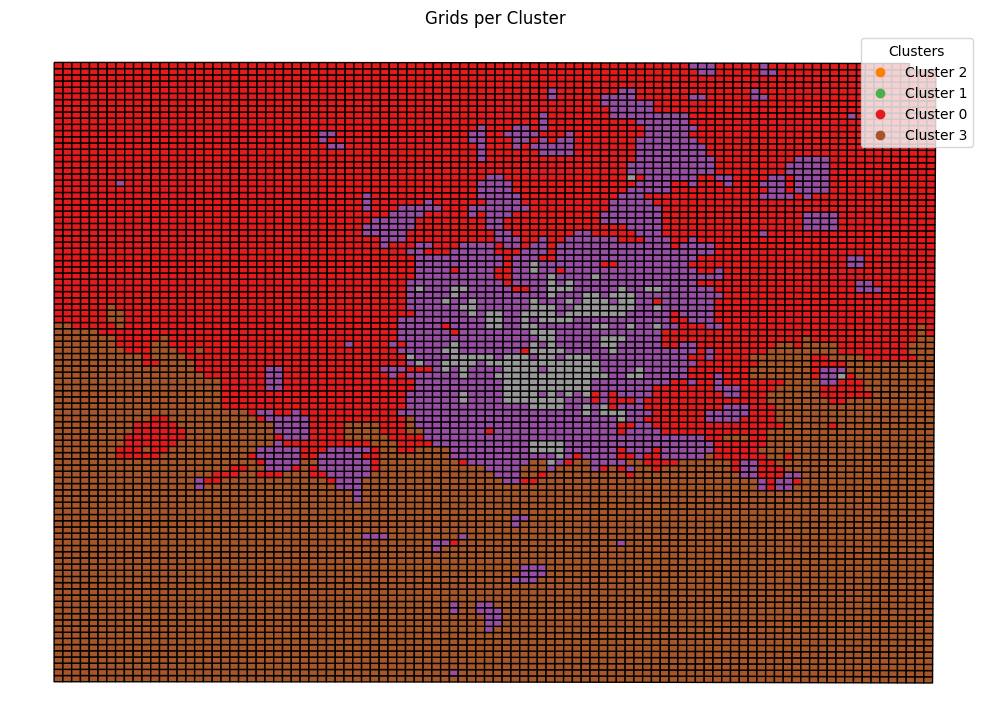

In [38]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

k = 4
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

#add cluster labels to DataFrame
selected_features_df['cluster'] = clusters

#create polygons from coordinates
geo_df['geometry'] = geo_df['coordinates'].apply(lambda coords: Polygon(coords))
geo_gdf = gpd.GeoDataFrame(geo_df, geometry='geometry')

#merge with clusters
geo_clusters = geo_gdf.merge(selected_features_df[['cluster']], left_on='gridID', right_index=True)

fig, ax = plt.subplots(figsize=(10, 10))
geo_clusters.plot(
    column='cluster', ax=ax, cmap='Set1', edgecolor='black', legend=False
)

#create legend with labels
for cluster_id in geo_clusters['cluster'].unique():
    ax.scatter([], [], color=plt.cm.Set1(cluster_id / k), label=f'Cluster {cluster_id}')

plt.legend(title='Clusters')
plt.title("Grids per Cluster")
plt.axis('off')
plt.tight_layout()
plt.show()

In [39]:
from sklearn.metrics import silhouette_score

#silhouette score
score = silhouette_score(scaled_features, selected_features_df['cluster'])
print(f"Silhouette Score for k={k}: {score:.4f}")


Silhouette Score for k=4: 0.2072


In [40]:
#Statistics for each cluster
grouped = selected_features_df.groupby('cluster').mean(numeric_only=True)
display(grouped)

,smsAvg_weekly,callAvg_weekly,dailySms/dailyCall,hourlycallAvg_WE,hourlysmsMin_WD,hourlycallMin_WE,internetAvgdiff_weekly,internetAvg_weekly,dailyCallIn/dailyCallOut,hourlysmsMin_WE,...,hourlyinternetAvg_WD,dailySmsIn/dailySmsOut,area,compactness,dailyInternet/dailySmsCall,smsAvgdiff_weekly,hourlycallMin_WD,callAvgdiff_weekly,hourlycallAvg_WD,distance_from_center
cluster,,,,,,,,,,,,,,,,,,,,,
0,1585.465973,1648.283100,0.975755,19.006417,1.538105,0.537632,-183.572853,13364.751680,0.875186,1.891561,...,231.333361,2.051749,0.000006,0.761521,4.336505,-27.298056,0.400844,-24.929633,33.116369,0.110351
1,7095.528438,7110.172858,0.979589,82.146392,7.444917,2.756752,647.448569,42451.959760,0.879305,8.727541,...,677.000868,2.024661,0.000006,0.761600,4.555096,-35.132905,1.817624,-31.895001,142.740541,0.054793
2,694.385120,709.772487,0.987014,8.059378,0.446347,0.204334,-35.410709,7141.092281,0.935127,0.534436,...,122.743588,2.086878,0.000006,0.761782,5.461599,-5.289723,0.168831,-5.187510,14.342984,0.111537
3,22568.928275,21711.238588,0.950571,230.056893,32.112724,9.299948,198.591492,47586.715671,0.870159,33.631580,...,778.363804,1.979764,0.000006,0.761627,4.365912,876.489028,6.205240,806.542055,449.718698,0.022746


**HIERARCHICAL**

Suggested number of clusters (elbow method): 6


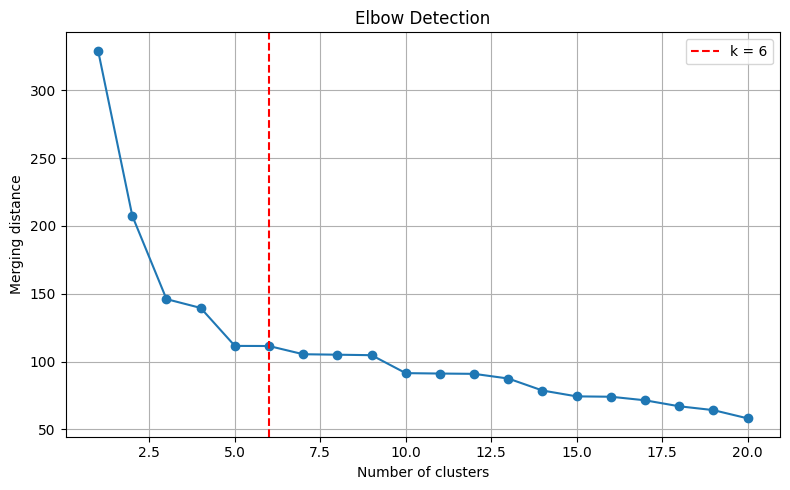

In [41]:
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist
import numpy as np
import matplotlib.pyplot as plt

#create linkage matrix
linkage_matrix = linkage(scaled_features, method='ward')

#merge linear measures
last = linkage_matrix[-20:, 2]
reversed_last = last[::-1]

#find differencial
diffs = np.diff(reversed_last)

#find best elbow
elbow_index = np.argmax(diffs) + 1  # +1 γιατί η diff έχει μήκος -1
optimal_clusters = elbow_index + 1

print(f"Suggested number of clusters (elbow method): {optimal_clusters}")

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(reversed_last)+1), reversed_last, marker='o')
plt.axvline(optimal_clusters, color='red', linestyle='--', label=f'k = {optimal_clusters}')
plt.title("Elbow Detection")
plt.xlabel("Number of clusters")
plt.ylabel("Merging distance")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


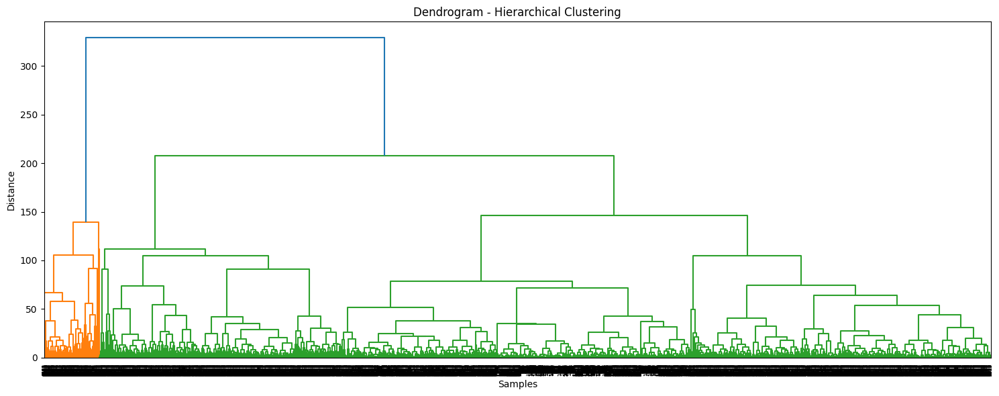

Silhouette Score for Hierarchical Clustering (k=6): 0.1481


In [42]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score

#normalization
scaler = StandardScaler()
scaled_features = scaler.fit_transform(selected_features_df.drop(columns=['cluster'], errors='ignore'))

#create linkage matrix
linkage_matrix = linkage(scaled_features, method='ward')

#Dendrogram
plt.figure(figsize=(15, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=20)  #first 20
plt.title("Dendrogram - Hierarchical Clustering")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()

#create labels for k=6
k = 6
hierarchical_labels = fcluster(linkage_matrix, t=k, criterion='maxclust')

#find silhouette score
score = silhouette_score(scaled_features, hierarchical_labels)
print(f"Silhouette Score for Hierarchical Clustering (k={k}): {score:.4f}")


**DBSCAN**

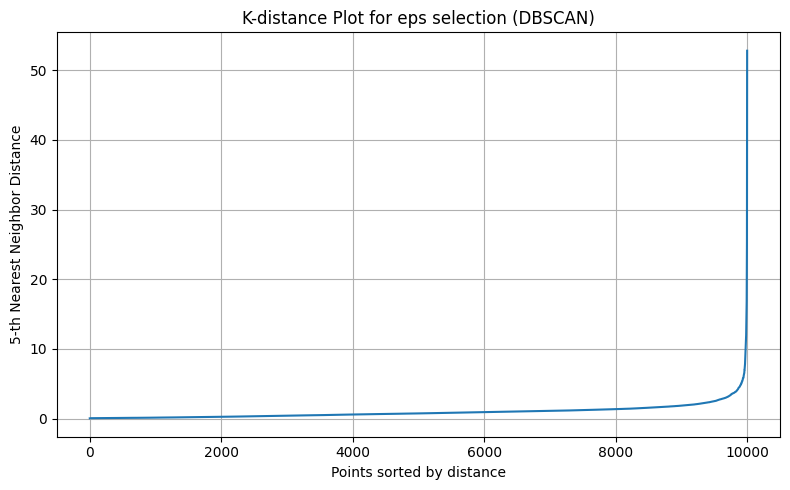

In [43]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

#K-distance plot
k = 5  # k = min_samples
neigh = NearestNeighbors(n_neighbors=k)
nbrs = neigh.fit(scaled_features)
distances, indices = nbrs.kneighbors(scaled_features)

#distance sorting for elbow detection
k_distances = np.sort(distances[:, k-1])

plt.figure(figsize=(8, 5))
plt.plot(k_distances)
plt.ylabel(f"{k}-th Nearest Neighbor Distance")
plt.xlabel("Points sorted by distance")
plt.title("K-distance Plot for eps selection (DBSCAN)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [44]:
#select eps value from graph
eps = 3

#apply DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=k)
clusters = dbscan.fit_predict(scaled_features)

#num of clusters
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
print(f"Number of clusters (without noise): {n_clusters}")

sil_score = silhouette_score(scaled_features, clusters)
print(f"Silhouette Score: {sil_score:.4f}")

Number of clusters (without noise): 3
Silhouette Score: 0.5106


___________________________________________________________________________________________________________________________________________________________

**Top 10 Grids Με Την Μεγαλύτερη Δραστηριότητα**

In [45]:
#Sort grids by total volumes of SMS, Call & Internet activities
smsGridActivity = gridActivity[['totalSMS']].sort_values(by = 'totalSMS',ascending=False)
callGridActivity = gridActivity[['totalCall']].sort_values(by = 'totalCall',ascending=False)
internetGridActivity = gridActivity[['totalInternet']].sort_values(by = 'totalInternet',ascending=False)
#Fetch the top 10 grids from the sorted grids and display them
top10 = pd.DataFrame()
top10['sms'] = smsGridActivity[:10].index.values
top10['call'] = callGridActivity[:10].index.values
top10['internet'] = internetGridActivity[:10].index.values

In [46]:
top10

,sms,call,internet
0,5059,5059,9977
1,5161,5161,9978
2,6064,6064,9976
3,5061,5061,8189
4,5262,5159,48
5,5159,5262,6579
6,5259,5259,6578
7,5162,5162,6576
8,5163,6165,6575
9,6165,6058,6574


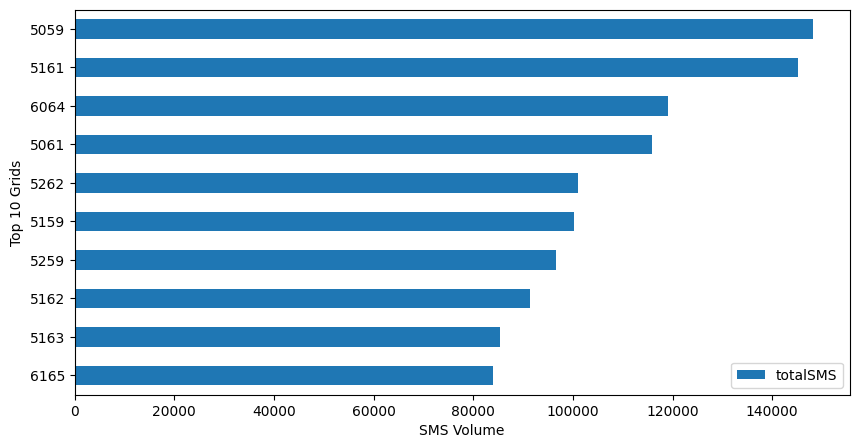

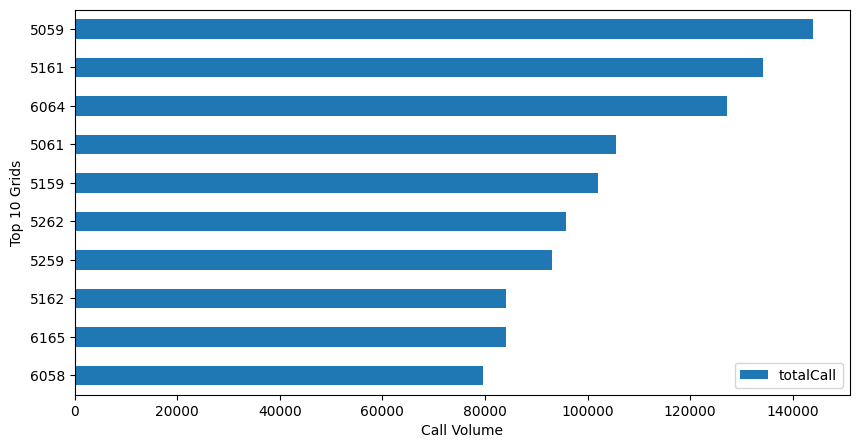

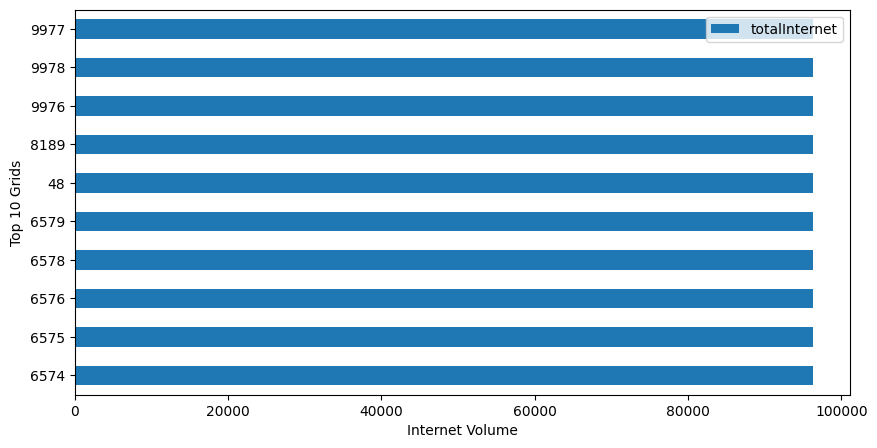

In [47]:
#Plot top 10 grids and its volume for SMS activity
ax = smsGridActivity[:10].plot(kind='barh', figsize=(10,5))
ax.invert_yaxis()
ax.set_xlabel("SMS Volume")
ax.set_ylabel("Top 10 Grids")

#Plot top 10 grids and its volume for Call activity
ax = callGridActivity[:10].plot(kind='barh', figsize=(10,5))
ax.invert_yaxis()
ax.set_xlabel("Call Volume")
ax.set_ylabel("Top 10 Grids")

#Plot top 10 grids and its volume for Internet activity
ax = internetGridActivity[:10].plot(kind='barh', figsize=(10,5))
ax.invert_yaxis()
ax.set_xlabel("Internet Volume")
ax.set_ylabel("Top 10 Grids")
plt.show()

In [48]:
cv_overall = {}

for col in top10.columns:
    grid_ids = top10[col].values

    # collect all values, dailyGridActivity for all grid ids
    values = dailyGridActivity[dailyGridActivity['gridID'].isin(grid_ids)][col]

    # calculate CV: std / mean
    mean_val = values.mean()
    std_val = values.std()
    cv = std_val / mean_val if mean_val != 0 else np.nan

    cv_overall[f'cv_{col}'] = cv

# results
for k, v in cv_overall.items():
    print(f"{k}: {v:.4f}")


cv_sms: 0.3460
cv_call: 0.3947
cv_internet: 0.0514


**Mapping top Grids βάσει τοποθεσίας**

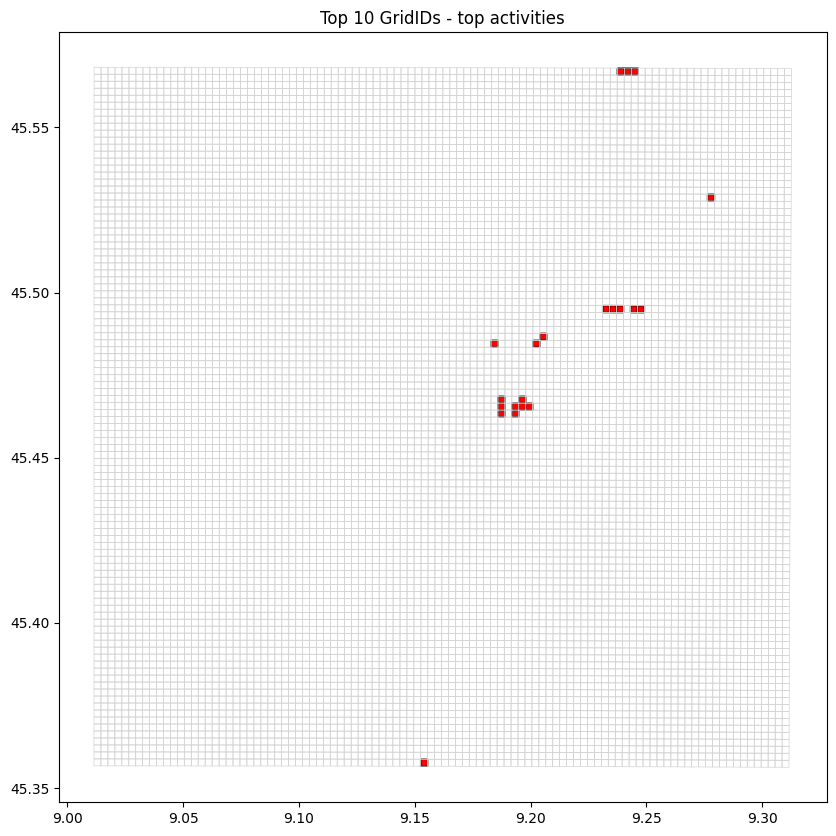

Longitude & Lattitude for Top grids:
GridID: 48, Longitude & Lattitude: POLYGON ((9.152511470365633 45.35870007278477, 9.155511894317572 45.358696027087255, 9.155506100198046 45.356580715055415, 9.152505788035942 45.3565847604562, 9.152511470365633 45.35870007278477))
GridID: 5059, Longitude & Lattitude: POLYGON ((9.185862677342813 45.464415668310075, 9.188868698831616 45.4644107375785, 9.188861635922354 45.462295468573735, 9.18585572684475 45.46230039894366, 9.185862677342813 45.464415668310075))
GridID: 5061, Longitude & Lattitude: POLYGON ((9.19187471953554 45.46440572774091, 9.194880739442098 45.46440063879739, 9.194873451710762 45.46228537053336, 9.191867544215187 45.46229045910362, 9.19187471953554 45.46440572774091))
GridID: 5159, Longitude & Lattitude: POLYGON ((9.185869628613263 45.4665309368889, 9.188875762525754 45.466526005795636, 9.188868698831616 45.4644107375785, 9.185862677342813 45.464415668310075, 9.185869628613263 45.4665309368889))
GridID: 5161, Longitude & Lattitud

In [49]:
import geopandas as gpd
import geojsonio
import matplotlib.pyplot as plt

# Display only top 10 grids from the geojson file
milan = gpd.read_file('/content/drive/MyDrive/milano-grid.geojson')

# get unique values across all the columns in dataframe top10
topgrids = pd.unique(top10.values.ravel())

# Filter GeoDataFrame for top grids
topGridgeojson = milan.loc[milan['cellId'].isin(topgrids)]

# Display in geojson viewer
geojsonio.display(topGridgeojson.to_json())

# Plot map
fig, ax = plt.subplots(figsize=(10, 10))
milan.boundary.plot(ax=ax, color='lightgray', linewidth=0.5)
topGridgeojson.plot(ax=ax, color='red', edgecolor='black')
plt.title("Top 10 GridIDs - top activities")
plt.show()

# Longitude Lattitude for top grids
print("Longitude & Lattitude for Top grids:")
for idx, row in topGridgeojson.iterrows():
    print(f"GridID: {row['cellId']}, Longitude & Lattitude: {row['geometry']}")


**Κατανομή Δραστηριότητας**

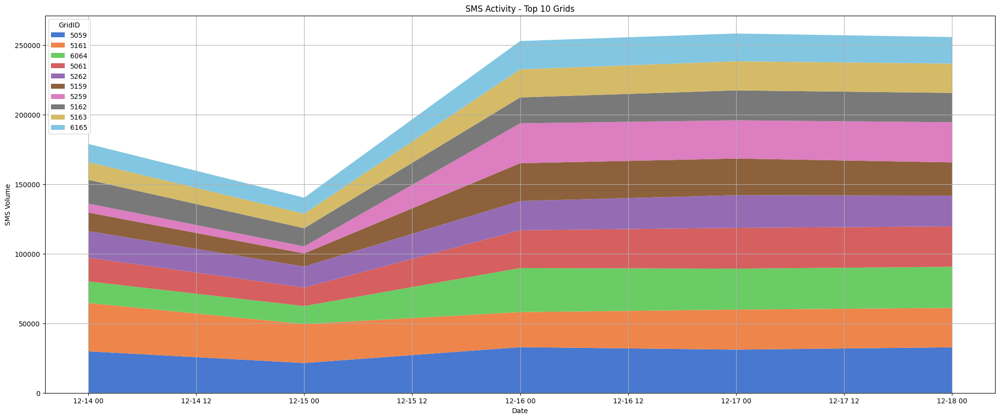

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

grids = [5059, 5161, 6064, 5061, 5262, 5159, 5259, 5162, 5163, 6165]
labels = [str(gid) for gid in grids]
col = sns.color_palette("muted", n_colors=10)
daily_sms = []

for gid in grids:
    df = dailyGridActivity[dailyGridActivity['gridID'] == gid]
    df = df.set_index('startTime') if 'startTime' in df.columns else df
    daily_sms.append(df['sms'])

plt.figure(figsize=(25,10))
plt.stackplot(daily_sms[0].index, *daily_sms, labels=labels, colors=col)
plt.legend(loc='best', title="GridID")
plt.xlabel('Date')
plt.ylabel('SMS Volume')
plt.title('SMS Activity - Top 10 Grids')
plt.grid(True)
plt.show()




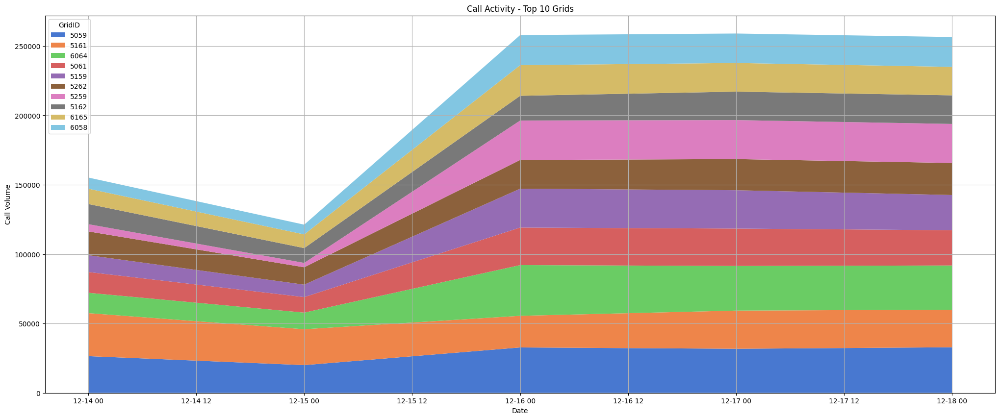

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Grid IDs
grids = [5059, 5161, 6064, 5061, 5159, 5262, 5259, 5162, 6165, 6058]

# labels
labels = [str(g) for g in grids]


col = sns.color_palette("muted", n_colors=len(grids))

# time series
daily_call = []
for gid in grids:
    df = dailyGridActivity[dailyGridActivity['gridID'] == gid]
    df = df.set_index('startTime') if 'startTime' in df.columns else df
    daily_call.append(df['call'])

# Stackplot
plt.figure(figsize=(25,10))
plt.stackplot(daily_call[0].index, *daily_call, labels=labels, colors=col)
plt.legend(loc='best', title="GridID")
plt.xlabel('Date')
plt.ylabel('Call Volume')
plt.title('Call Activity - Top 10 Grids')
plt.grid(True)
plt.show()


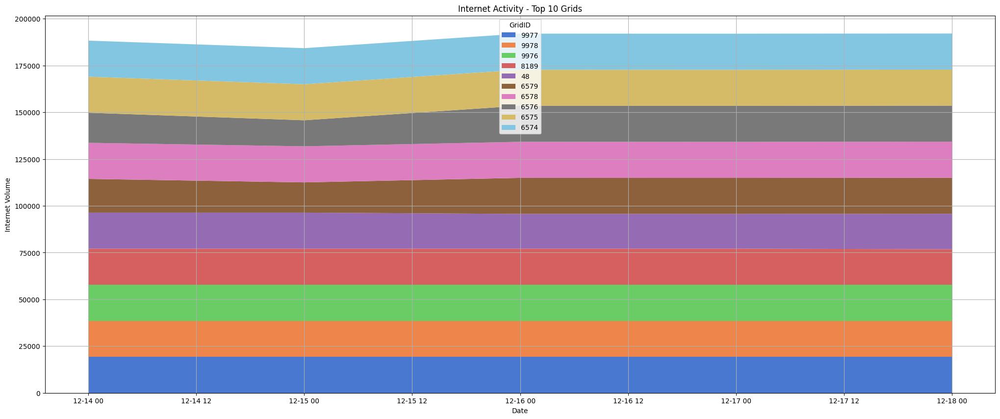

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Grid IDs
grids = [9977, 9978, 9976, 8189, 48, 6579, 6578, 6576, 6575, 6574]

# labels for legend
labels = [str(g) for g in grids]


col = sns.color_palette("muted", n_colors=len(grids))

# internet time series
daily_internet = []
for gid in grids:
    df = dailyGridActivity[dailyGridActivity['gridID'] == gid]
    df = df.set_index('startTime') if 'startTime' in df.columns else df
    daily_internet.append(df['internet'])

# Stackplot Internet
plt.figure(figsize=(25,10))
plt.stackplot(daily_internet[0].index, *daily_internet, labels=labels, colors=col)
plt.legend(loc='best', title="GridID")
plt.xlabel('Date')
plt.ylabel('Internet Volume')
plt.title('Internet Activity - Top 10 Grids')
plt.grid(True)
plt.show()
